In [70]:
import os

def run_fast_scandir(dir, ext):    
    subfolders, datafiles = [], []

    for f in os.scandir(dir):
        if f.is_dir():
            subfolders.append(f.path)
        if f.is_file():
            if os.path.splitext(f.name)[1].lower() in ext:
                datafiles.append(f.path)

    for dir in list(subfolders):
        sf, f = run_fast_scandir(dir, ext)
        subfolders.extend(sf)
        datafiles.extend(f)
    return subfolders, datafiles

In [71]:
def pick_channels(ch_labels, desired_channels):
    ch_idx = []    
    for dc in desired_channels:
        for i, c in enumerate(ch_labels):
            if dc in c:
                ch_idx.append(i)
    return ch_idx

# **Importing signal**

## Signal info

In [72]:
import mne
import numpy as np

file = "Sara_session_01.edf"
raw_eeg = mne.io.read_raw_edf(f"C:/Users/migue/OneDrive/Ambiente de Trabalho/Tese/EEG Data/{file}", preload=True)

print("\n", raw_eeg.info.keys())
print("\n", raw_eeg.info)

ch = raw_eeg.info["ch_names"] # Channel labels
fs = raw_eeg.info["sfreq"]

print("\nChannel labels: ", ch)

Extracting EDF parameters from C:\Users\migue\OneDrive\Ambiente de Trabalho\Tese\EEG Data\Sara_session_01.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1366271  =      0.000 ...   667.125 secs...



 dict_keys(['acq_pars', 'acq_stim', 'ctf_head_t', 'description', 'dev_ctf_t', 'dig', 'experimenter', 'utc_offset', 'device_info', 'file_id', 'highpass', 'hpi_subsystem', 'kit_system_id', 'helium_info', 'line_freq', 'lowpass', 'meas_date', 'meas_id', 'proj_id', 'proj_name', 'subject_info', 'xplotter_layout', 'gantry_angle', 'bads', 'chs', 'comps', 'events', 'hpi_meas', 'hpi_results', 'projs', 'proc_history', 'custom_ref_applied', 'sfreq', 'dev_head_t', 'ch_names', 'nchan'])

 <Info | 7 non-empty values
 bads: []
 ch_names: EEG T7'', EEG TP7'', EEG P7'', EEG PO7'', EEG CP5'', EEG P5'', ...
 chs: 38 EEG
 custom_ref_applied: False
 highpass: 0.1 Hz
 lowpass: 538.0 Hz
 meas_date: 2024-04-08 16:23:54 UTC
 nchan: 38
 projs: []
 sfreq: 2048.0 Hz
>

Channel labels:  ["EEG T7''", "EEG TP7''", "EEG P7''", "EEG PO7''", "EEG CP5''", "EEG P5''", "EEG PO5''", "EEG C3''", "EEG CP3''", "EEG P3''", "EEG PO3''", "EEG FP1''", "EEG CP1''", "EEG P1''", "EEG O1''", "EEG Cz''", "EEG CPz''", "EEG Pz''", "EEG 

# **Analysing signal quality and pre-processing data accordingly**

## Re-referencing

In [73]:
'''
car = mne.pick_channels(ch, include = [], exclude = ['EEG FP1', 'EEG FP2','dc01+', 'dc02+', 'MKR+'])
ch_list = [ch[c] for c in car] 
eeg = raw.copy().pick(ch_list)
eeg.set_eeg_reference(ref_channels = 'ch_list')
'''
exclude_ch = [" FP1", " FP2"]
exclude_ch_idx = pick_channels(ch, exclude_ch)

## Checking if the recorded signal is an EEG (1/f shape)

### Designing the band pass filter

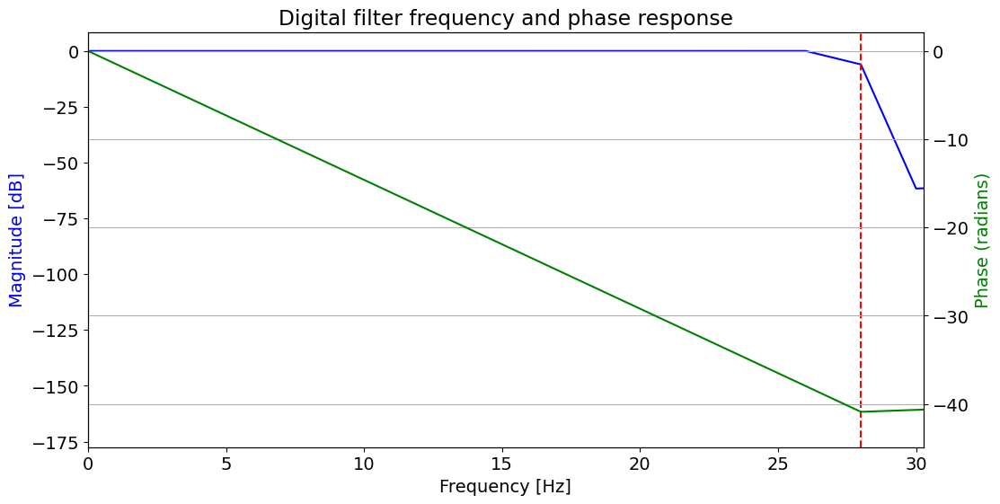

In [74]:
import scipy
from scipy.signal import filtfilt, firwin, freqz

import matplotlib.pyplot as plt
from matplotlib.pyplot import figure

# Designing a low-pass FIR filter at 28 Hz
nyquist = fs/2
lowcut = 28
numtaps = 3001 # Order
filt = firwin(numtaps, lowcut/nyquist, pass_zero=True)  
'''
pass_zero -> If True, the gain at frequency 0 (DC) is 1, creating a low-pass filter.
              If False, the DC gain is 0, creating a high-pass filter.
'''

# Ploting the frequency response of the filter
w, h = freqz(filt) # The frequency response is returned as a tuple (w, h), where w is the array of frequencies and h is the array of complex coeficients (w: rad/samples)

fig, ax1 = plt.subplots(figsize = (12,6))

ax1.set_title('Digital filter frequency and phase response')
ax1.plot(w*fs/(2*np.pi), 20 * np.log10(abs(h)), 'b')
ax1.set_ylabel('Magnitude [dB]', color='b')
ax1.set_xlabel('Frequency [Hz]')
ax1.set_xticks(np.arange(0,lowcut * 4/3.7, 5))
ax1.axvline(x = lowcut, color = 'r', linestyle = '--')

ax2 = ax1.twinx()
ax2.plot(w*fs/(2*np.pi), np.unwrap(np.angle(h)), 'g')
ax2.set_ylabel('Phase (radians)', color='g')
ax2.grid(True)
ax2.axis('tight')
ax2.set_xlim(0, lowcut * 4/3.7)

plt.show()

# Applying the filter to the signal using filtfilt
# EEG shape: (channels, samples)
eeg_ch_idx = mne.pick_channels(ch, include = [], exclude = ['dc01+', 'dc02+', 'MKR+'])
filt_eeg = filtfilt(filt, 1, raw_eeg.get_data(picks = eeg_ch_idx), axis = 1)


### Apllying the FFT on the EEG signal

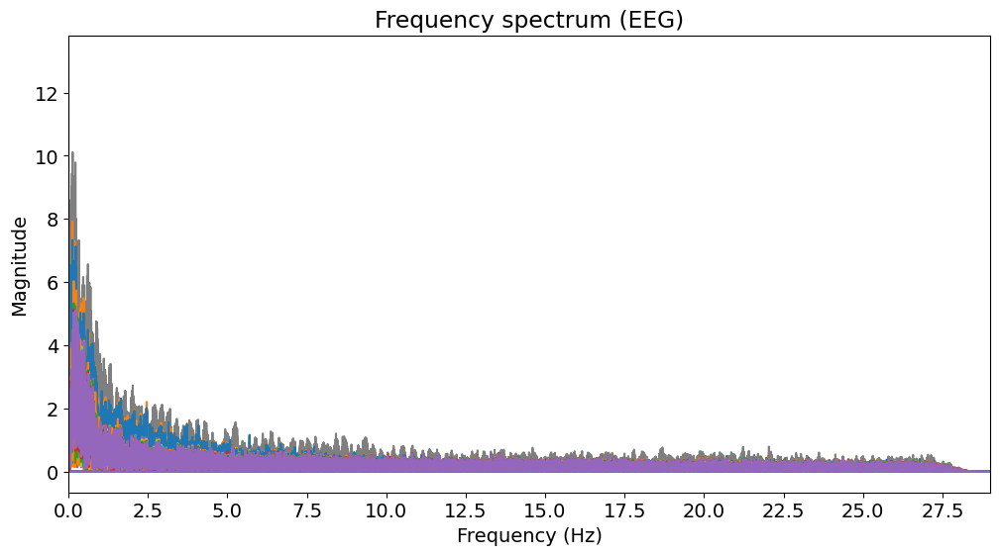

In [75]:
X = np.fft.fft(filt_eeg,axis = 1)

# Compute the frequency vector
freqs = np.fft.fftfreq(np.size(X,1), 1/fs)

# Plot the frequency spectrum
figure(figsize = (12,6))
plt.plot(freqs, np.abs(X.T))
plt.title("Frequency spectrum (EEG)")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')
plt.xlim(0, lowcut + 1)
plt.xticks(np.arange(0, lowcut + 1, 2.5)) 
plt.show()

## Analysing electrode smearing/bridging

Creating RawArray with float64 data, n_channels=35, n_times=1366272
    Range : 0 ... 1366271 =      0.000 ...   667.125 secs
Ready.
Local minimum 1.3285376861000213 found
Bridge detected between P7 and P5
Bridge detected between PO7 and PO5
Bridge detected between POz and Oz
Bridge detected between CP4 and CP6
Bridge detected between PO6 and PO8


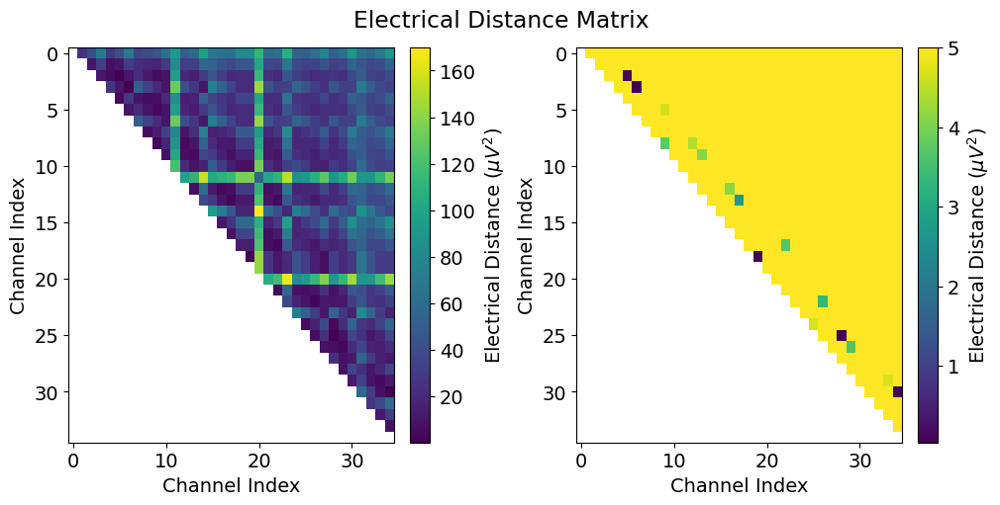

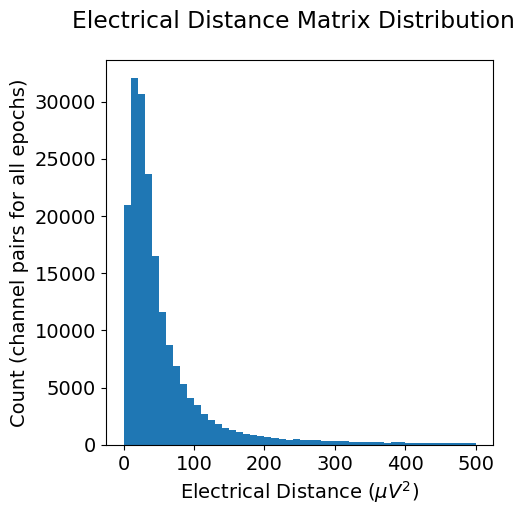

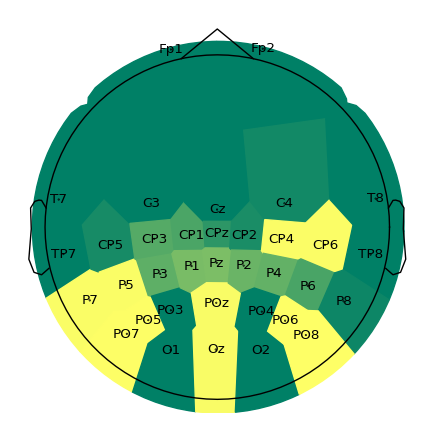

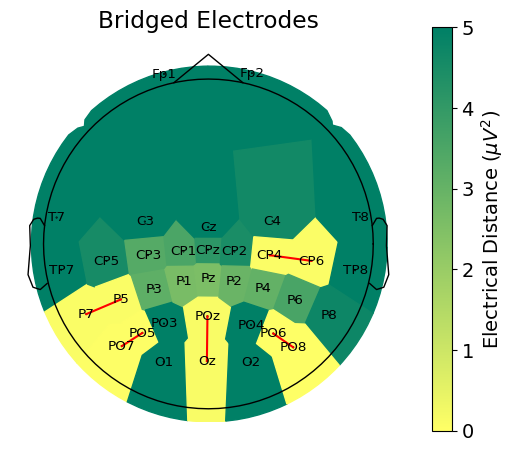

In [76]:
cust_ch = [ch[c].split("EEG ")[1] for c in eeg_ch_idx if ("EEG " in ch[c])]
clean_ch = [c.split("''")[0] for c in cust_ch]

for c in range(len(clean_ch)):
    if clean_ch[c] == 'FP1':
        clean_ch[c] = 'Fp1'
    elif (clean_ch[c] == 'FP2'):
        clean_ch[c] = 'Fp2'

ch_types = ['eeg'] * len(clean_ch)

new_info = mne.create_info(ch_names = clean_ch, sfreq = fs, ch_types = ch_types)
eeg_smearing = mne.io.RawArray(filt_eeg, new_info)
eeg_smearing.set_montage('standard_1005')

## Examine an Electrical Distance Matrix

ed_data = mne.preprocessing.compute_bridged_electrodes(eeg_smearing)
bridged_idx, ed_matrix = ed_data

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5), layout="constrained")
fig.suptitle("Electrical Distance Matrix")

# take median across epochs, only use upper triangular, lower is NaNs
ed_plot = np.zeros(ed_matrix.shape[1:]) * np.nan
triu_idx = np.triu_indices(ed_plot.shape[0], 1)
for idx0, idx1 in np.array(triu_idx).T:
    ed_plot[idx0, idx1] = np.nanmedian(ed_matrix[:, idx0, idx1])

# plot full distribution color range
im1 = ax1.imshow(ed_plot, aspect="auto")
cax1 = fig.colorbar(im1, ax=ax1)
cax1.set_label(r"Electrical Distance ($\mu$$V^2$)")

# plot zoomed in colors
im2 = ax2.imshow(ed_plot, aspect="auto", vmax=5)
cax2 = fig.colorbar(im2, ax=ax2)
cax2.set_label(r"Electrical Distance ($\mu$$V^2$)")
for ax in (ax1, ax2):
    ax.set_xlabel("Channel Index")
    ax.set_ylabel("Channel Index")

## Examine the Distribution of Electrical Distances

fig, ax = plt.subplots(figsize=(5, 5))
fig.suptitle("Electrical Distance Matrix Distribution")
ax.hist(ed_matrix[~np.isnan(ed_matrix)], bins=np.linspace(0, 500, 51))
ax.set_xlabel(r"Electrical Distance ($\mu$$V^2$)")
ax.set_ylabel("Count (channel pairs for all epochs)")

## Plot Electrical Distances on a Topomap

mne.viz.plot_bridged_electrodes(
    eeg_smearing.info,
    bridged_idx,
    ed_matrix, 
    title = "Bridged Electrodes",
    topomap_args=dict(vlim=(None, 5), 
                 size = 10,
                 sphere=(-0.001, 0.0001, 0.12, 0.2)),
)

## Interpolating bridged channels

In [77]:
bridged_idx = ed_data[0]

num_smeared_electrodes = 0
for i in bridged_idx:
     num_smeared_electrodes += len(i)

print("Number of connections: ", num_smeared_electrodes)

if(len(bridged_idx) > 0 and num_smeared_electrodes <= 8):
    filt_eeg = mne.preprocessing.interpolate_bridged_electrodes(
        eeg_smearing.copy(), 
        bridged_idx=bridged_idx
    )
    
    filt_eeg = filt_eeg.get_data()


Number of connections:  10


## Re-referencing

In [78]:
'''
car = np.zeros(np.shape(filt_eeg))
for dt in range(np.size(filt_eeg,1)):
    ch_sum = []
    for c in range(np.size(filt_eeg,0)):
        if c not in exclude_ch_idx:
            ch_sum.append(filt_eeg[c,dt])
    car[:,dt] = filt_eeg[:,dt] - np.mean(ch_sum)

filt_eeg = car
'''

'\ncar = np.zeros(np.shape(filt_eeg))\nfor dt in range(np.size(filt_eeg,1)):\n    ch_sum = []\n    for c in range(np.size(filt_eeg,0)):\n        if c not in exclude_ch_idx:\n            ch_sum.append(filt_eeg[c,dt])\n    car[:,dt] = filt_eeg[:,dt] - np.mean(ch_sum)\n\nfilt_eeg = car\n'

## Isolating the LDR channel

In [79]:
def plot_isolated_signal(time, signal, th, title):
    figure(figsize = (400,20))
    plt.plot(time, signal, linewidth = 2);
    plt.title(title, fontsize = 100, fontweight = 'bold')
    plt.xlabel('Time (min)', fontsize = 85, fontweight = 'bold')
    plt.ylabel('Voltage (V)', fontsize = 85, fontweight = 'bold')
    plt.xticks(np.arange(0, np.max(time), 0.05), fontsize = 30)
    plt.yticks(np.arange(np.min(signal), np.max(signal), 0.1), fontsize = 30)
    plt.xlim([0,max(time)])
    plt.axhline(y = th, color = 'k', linestyle = '--', linewidth = 2)
    plt.grid()

In [80]:
ldr_ch_idx = mne.pick_channels(ch, include = ['dc01+'])
ldr_ch = raw_eeg.get_data(picks = ch[ldr_ch_idx[0]])
if (np.mean(ldr_ch) < 0): # If the polarity was inverted
    print("Inverting signal...")
    ldr_ch = ldr_ch * -1
''' 
The bright square (more light) will decrease the resistance of the LDR, thus producing more voltage
aproximating 2.4V if the polarity of the component was right or -2.4V if the polarity was inverted

The dark square will increase the resistance to the MOhm range and cause the signal to be almost 0.
This is because all the voltage will be sucked by the first component (LDR) of the voltage divider.
'''

time = np.arange(0, np.size(ldr_ch,1)/fs, 1/fs) # Time vector of the acquisition in s

if(np.mean(ldr_ch) >= 0.65):
    th = 1.2 # y value threshold to segment signal
else:
    th = 0.8

#plot_isolated_signal(time/60, ldr_ch[0][:], th, "LDR channel") # time/60 = timevector in minutes

## Filtering the LDR channel (Median filter)

In [81]:
if(np.mean(ldr_ch) >= 0.65):
    n_filt = 201
else:
    n_filt = 21

print("Average Voltage (LDR): ", np.mean(ldr_ch))

filt_ldr_ch = scipy.signal.medfilt(ldr_ch[:][0], n_filt) 
# A 201 points median filter seems to be enough to smooth the signal without causing phase shifts
# The filter applies a zero pad automatically at the edges

plot_isolated_signal(time/60, filt_ldr_ch, th, "Filtered LDR channel")
plt.show()

Average Voltage (LDR):  0.6742393135275689


# **Segmenting the EEG**

## Detecting the edges on the LDR channel

In [82]:
def condition_segmentation(ldr, th):
    
    last_low = True
    last_high = False
    
    rising_edges = []
    falling_edges = []

    for index, val in enumerate(ldr):

        if val >= th: # Possible rising edge
            if last_low: # Found rising edge
                rising_edges.append(index) 
            
            last_low = False
            last_high = True
        
        elif val <= th: # Possible falling edge
            if last_high:
                falling_edges.append(index)

            last_low = True
            last_high = False

    return rising_edges, falling_edges

In [83]:
d_th = th - 0.1 # Divinding the LDR channel in the target and non target range
t_th = th

if(np.mean(ldr_ch) >= 0.65):
    nt_th = 0.675
else:
    nt_th = 0.4

# Target trials
target_range = [val if val >= d_th else d_th for val in filt_ldr_ch]
t_rising_edges, t_falling_edges = condition_segmentation(target_range, t_th)

# Non target trials
nontarget_range = [val if val <= d_th else d_th for val in filt_ldr_ch]
nt_rising_edges, nt_falling_edges = condition_segmentation(nontarget_range, nt_th)

if(len(nt_rising_edges) > len(nt_falling_edges)):
    nt_rising_edges.pop(-1)

# SSVEP trial blocks
trialBlock_range = [val if val <= 0.21 else d_th for val in filt_ldr_ch]
ssvep_rising_edges, ssvep_falling_edges = condition_segmentation(trialBlock_range, 0.2)

ssvep_rising_edges.pop(0), ssvep_falling_edges.pop(0) # EOG edge
ssvep_rising_edges.pop(0), ssvep_falling_edges.pop(0)# EMG edge

if (len(ssvep_rising_edges) > 14):
    ssvep_rising_edges.pop(-1) # After finishing the protocol there is one non-relevant rising edge


'''
plot_isolated_signal(time/60, filt_ldr_ch, t_th, "Filtered LDR channel with target segmentation")
for idx, start_sample in enumerate(t_rising_edges):
    print(f"Block nº {idx+1} size: {len(filt_ldr_ch[t_rising_edges[idx]:t_falling_edges[idx]])/fs}")
    plt.axvline(x = start_sample/fs/60, color = 'g', linestyle = ':', linewidth = 2)
    plt.axvline(x = t_falling_edges[idx]/fs/60, color = 'r', linestyle = ':', linewidth = 2)
plt.show()


plot_isolated_signal(time/60, filt_ldr_ch, nt_th, "Filtered LDR channel with non-target segmentation")
for idx, start_sample in enumerate(nt_rising_edges):
    print(f"Block nº {idx+1} size: {len(filt_ldr_ch[nt_rising_edges[idx]:nt_falling_edges[idx]])/fs}")
    plt.axvline(x = start_sample/fs/60, color = 'g', linestyle = ':', linewidth = 2)
    plt.axvline(x = nt_falling_edges[idx]/fs/60, color = 'r', linestyle = ':', linewidth = 2)
plt.show()
'''

'\nplot_isolated_signal(time/60, filt_ldr_ch, t_th, "Filtered LDR channel with target segmentation")\nfor idx, start_sample in enumerate(t_rising_edges):\n    print(f"Block nº {idx+1} size: {len(filt_ldr_ch[t_rising_edges[idx]:t_falling_edges[idx]])/fs}")\n    plt.axvline(x = start_sample/fs/60, color = \'g\', linestyle = \':\', linewidth = 2)\n    plt.axvline(x = t_falling_edges[idx]/fs/60, color = \'r\', linestyle = \':\', linewidth = 2)\nplt.show()\n\n\nplot_isolated_signal(time/60, filt_ldr_ch, nt_th, "Filtered LDR channel with non-target segmentation")\nfor idx, start_sample in enumerate(nt_rising_edges):\n    print(f"Block nº {idx+1} size: {len(filt_ldr_ch[nt_rising_edges[idx]:nt_falling_edges[idx]])/fs}")\n    plt.axvline(x = start_sample/fs/60, color = \'g\', linestyle = \':\', linewidth = 2)\n    plt.axvline(x = nt_falling_edges[idx]/fs/60, color = \'r\', linestyle = \':\', linewidth = 2)\nplt.show()\n'

## Segmenting the EEG based on the LDR channel edges

In [84]:
preStim_offset = -0.2 # ms
posStim_offset = 0.6 

# Targets
target_eeg_blocks = []
t_events = []

for idx, start_sample in enumerate(t_rising_edges):

    if (idx == 0): # EOG time
        eog = filt_eeg[:,start_sample:t_falling_edges[idx]]
    elif (idx == 1): # EMG time
        emg = filt_eeg[:,start_sample:t_falling_edges[idx]]
        rsvp_start = t_falling_edges[idx]
    else: ## EEG time
        start = np.argmin(np.abs(time - start_sample/fs - preStim_offset))
        stop  = np.argmin(np.abs(time - start_sample/fs - posStim_offset)) 
        target_eeg_blocks.append(filt_eeg[:,start:stop+1])

        t_events.append([start_sample, 0 , 1])

# Non-Targets
nontarget_eeg_blocks = []
nt_events = []

for idx, start_sample in enumerate(nt_rising_edges):
    time_range1 = (nt_falling_edges[idx] - nt_rising_edges[idx])/fs

    # Non Target upper range
    if(time_range1 >= 0.17 and time_range1 <= 0.23):
        start1 = np.argmin(np.abs(time - start_sample/fs - preStim_offset))
        stop1  = np.argmin(np.abs(time - start_sample/fs - posStim_offset)) 
        nontarget_eeg_blocks.append(filt_eeg[:,start1:stop1+1])

        nt_events.append([start_sample, 0, 0])

    # Non Target lower range
    if(idx < len(nt_falling_edges)-1):
        time_range2 = (nt_rising_edges[idx+1] - nt_falling_edges[idx])/fs
        if(time_range2 >= 0.17 and time_range2 <= 0.23):
            start2 = np.argmin(np.abs(time - nt_falling_edges[idx]/fs - preStim_offset))
            stop2  = np.argmin(np.abs(time - nt_falling_edges[idx]/fs - posStim_offset)) 
            nontarget_eeg_blocks.append(filt_eeg[:,start2:stop2+1])

            nt_events.append([np.argmin(np.abs(time - nt_falling_edges[idx]/fs)), 0, 0])

print("Target blocks shape: ", np.shape(target_eeg_blocks))   
print("Non-Target blocks shape: ", np.shape(nontarget_eeg_blocks))   


Target blocks shape:  (210, 35, 1640)
Non-Target blocks shape:  (1406, 35, 1640)


## Frequency tagging and SNR estimation of the SSVEP component
https://mne.tools/dev/auto_tutorials/time-freq/50_ssvep.html

In [85]:
ssvep_events = []
for tb in range(len(ssvep_rising_edges)):
    ssvep_events.append([ssvep_rising_edges[tb], 0 , 0])

tmax = round((ssvep_falling_edges[1] - ssvep_rising_edges[1])/fs,1)

events_id = dict(trialBlocks=0)
ssvep_epochs = mne.Epochs(eeg_smearing, ssvep_events, event_id = events_id, tmin = 0, tmax = tmax, baseline=None, event_repeated = 'error')

Not setting metadata
14 matching events found
No baseline correction applied
0 projection items activated


### Calculate power spectral density (PSD)

In [86]:
tmin = 1 # SSVEP response can often take a while to stabilize and the transient phase in the beginning can distort the signal estimate.
fmin = 1
fmax = 26

spectrum = ssvep_epochs.compute_psd(
    "welch",
    n_fft=int(fs * (tmax - tmin)),
    n_overlap=0,
    n_per_seg=None,
    tmin=tmin,
    tmax=tmax,
    fmin=fmin,
    fmax=fmax,
    window="boxcar",
    verbose=False,
)
psds, freqs = spectrum.get_data(return_freqs=True)

### Calculate signal to noise ratio (SNR)

[Text(0.5, 1.0, 'SNR spectrum'),
 Text(0.5, 0, 'Frequency [Hz]'),
 Text(0, 0.5, 'SNR'),
 (-2.0, 30.0),
 (1.0, 26.1),

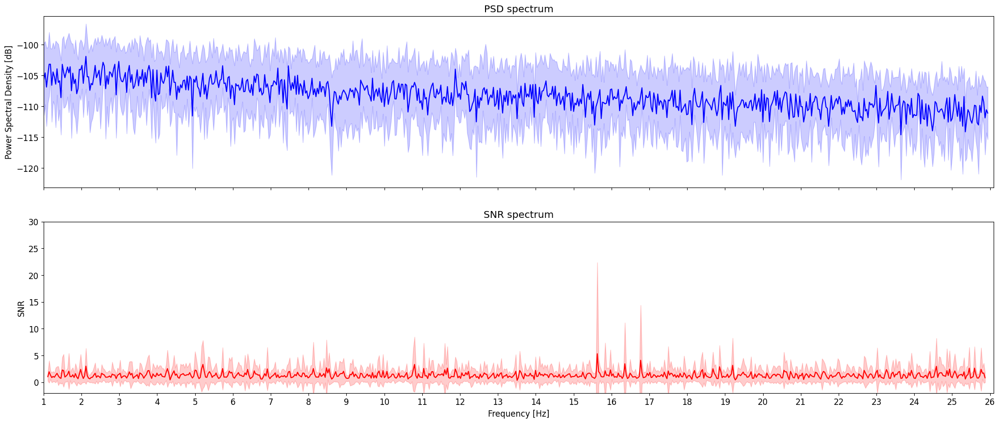

In [142]:
def snr_spectrum(psd, noise_n_neighbor_freqs=1, noise_skip_neighbor_freqs=1):
    """Compute SNR spectrum from PSD spectrum using convolution.

    Parameters
    ----------
    psd : ndarray, shape ([n_trials, n_channels,] n_frequency_bins)
        Data object containing PSD values. Works with arrays as produced by
        MNE's PSD functions or channel/trial subsets.
    noise_n_neighbor_freqs : int
        Number of neighboring frequencies used to compute noise level.
        increment by one to add one frequency bin ON BOTH SIDES
    noise_skip_neighbor_freqs : int
        set this >=1 if you want to exclude the immediately neighboring
        frequency bins in noise level calculation

    Returns
    -------
    snr : ndarray, shape ([n_trials, n_channels,] n_frequency_bins)
        Array containing SNR for all epochs, channels, frequency bins.
        NaN for frequencies on the edges, that do not have enough neighbors on
        one side to calculate SNR.
    """
    # Construct a kernel that calculates the mean of the neighboring
    # frequencies
    averaging_kernel = np.concatenate(
        (
            np.ones(noise_n_neighbor_freqs),
            np.zeros(2 * noise_skip_neighbor_freqs + 1),
            np.ones(noise_n_neighbor_freqs),
        )
    )
    averaging_kernel /= averaging_kernel.sum()

    # Calculate the mean of the neighboring frequencies by convolving with the
    # averaging kernel.
    mean_noise = np.apply_along_axis(
        lambda psd_: np.convolve(psd_, averaging_kernel, mode="valid"), axis=-1, arr=psd
    )

    # The mean is not defined on the edges so we will pad it with nas. The
    # padding needs to be done for the last dimension only so we set it to
    # (0, 0) for the other ones.
    edge_width = noise_n_neighbor_freqs + noise_skip_neighbor_freqs
    pad_width = [(0, 0)] * (mean_noise.ndim - 1) + [(edge_width, edge_width)]
    mean_noise = np.pad(mean_noise, pad_width=pad_width, constant_values=np.nan)

    return psd / mean_noise

snrs = snr_spectrum(psds, noise_n_neighbor_freqs=2, noise_skip_neighbor_freqs=1)

fig, axes = plt.subplots(2, 1, sharex="all", sharey="none", figsize=(25, 10))
freq_range = range(
    np.where(np.floor(freqs) == 1.0)[0][0],  np.where(np.ceil(freqs) == fmax)[0][-1]
)

psds_plot = 10 * np.log10(psds)
psds_mean = psds_plot.mean(axis=(0, 1))[freq_range]
psds_std = psds_plot.std(axis=(0, 1))[freq_range]
axes[0].plot(freqs[freq_range], psds_mean, color="b")
axes[0].fill_between(
    freqs[freq_range], psds_mean - psds_std, psds_mean + psds_std, color="b", alpha=0.2
)
axes[0].set(title="PSD spectrum", 
            ylabel="Power Spectral Density [dB]",
            xticks = np.arange(fmin, fmax + 0.1, 0.5))

# SNR spectrum
snr_mean = snrs.mean(axis=(0, 1))[freq_range]
snr_std = snrs.std(axis=(0, 1))[freq_range]

axes[1].plot(freqs[freq_range], snr_mean, color="r")
axes[1].fill_between(
    freqs[freq_range], snr_mean - snr_std, snr_mean + snr_std, color="r", alpha=0.2
)
axes[1].set(
    title="SNR spectrum",
    xlabel="Frequency [Hz]",
    ylabel="SNR",
    ylim=[-2, 30],
    xlim=[fmin, fmax+0.1],
    xticks = np.arange(fmin, fmax + 0.1, 1)
)

### Extract SNR values at the stimulation frequency

In [143]:
stim_freq = 5 # Hz
harmonic1 = 10
harmonic2 = 15

# Find index of frequency bin closest to stimulation frequency and its harmonics
i_bin_5hz = np.argmin(abs(freqs - stim_freq))
i_bin_10hz = np.argmin(abs(freqs - harmonic1))
i_bin_15hz = np.argmin(abs(freqs - harmonic2))

# Define different ROIs
roi_vis = [
    "Oz",
    "O1",
    "O2",
]  # visual roi

# Find corresponding indices using mne.pick_types()
picks_roi_vis = mne.pick_types(
    ssvep_epochs.info, eeg=True, stim=False, exclude="bads", selection=roi_vis
)

snrs_target = snrs[:, :, i_bin_5hz][:, picks_roi_vis]
print("SNR at 5 Hz")
print(f"Average SNR (occipital ROI): {snrs_target.mean()}")

snrs_target_h1 = snrs[:, :, i_bin_10hz][:, picks_roi_vis]
print("SNR at 10 Hz")
print(f"Average SNR (occipital ROI): {snrs_target_h1.mean()}")

snrs_target_h2 = snrs[:, :, i_bin_15hz][:, picks_roi_vis]
print("SNR at 15 Hz")
print(f"Average SNR (occipital ROI): {snrs_target_h2.mean()}")



SNR at 5 Hz
Average SNR (occipital ROI): 3.2264908914882553
SNR at 10 Hz
Average SNR (occipital ROI): 1.6753844507073514
SNR at 15 Hz
Average SNR (occipital ROI): 1.4399286849214425


### Topography of the SSVEP

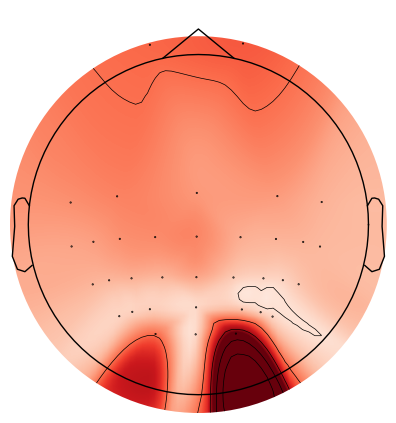

SNR at 5 Hz SSVEP stumulation
average SNR (all channels): 2.2702432588255266
average SNR (occipital ROI): 3.2264908914882553


Is the 5 Hz SNR in occipital ROI significantly larger than 5 Hz SNR over all?
----------- No ------------

channels: t = 1.024, p = 0.324




In [144]:
from scipy.stats import ttest_rel

# get average SNR at 12 Hz for ALL channels
snrs_5hz = snrs[:, :, i_bin_5hz]
snrs_5hz_ch_average = snrs_5hz.mean(axis=0)

# plot SNR topography
fig, ax = plt.subplots(1)
mne.viz.plot_topomap(snrs_5hz_ch_average, ssvep_epochs.info, vlim=(1, None), axes=ax)

print("SNR at 5 Hz SSVEP stumulation")
print(f"average SNR (all channels): {snrs_5hz_ch_average.mean()}")
print(f"average SNR (occipital ROI): {snrs_target.mean()}")
print("\n")

tstat_roi_vs_scalp = ttest_rel(snrs_target.mean(axis=1), snrs_5hz.mean(axis=1))
print("Is the 5 Hz SNR in occipital ROI significantly larger than 5 Hz SNR over all?")

if(tstat_roi_vs_scalp[1] > 0.05):
    print("----------- No ------------\n")
else:
    print("----------- Yes -----------\n")

print(f"Stats: t = {tstat_roi_vs_scalp[0]:.3f}, p = {tstat_roi_vs_scalp[1]:.3f}\n\n")

## xDawn

In [90]:
# Events only require the sample where the trials start. mne.Epochs with t_min accounts for the desired offset based on the sample where a trial begins
events = np.vstack((t_events,nt_events))
events_id = dict(target=1, nontarget=0)

sorted_events = events[events[:, 0].argsort()]  # Sort by first column (index 0)

custom_epochs = mne.Epochs(eeg_smearing,
                           sorted_events, 
                           event_id = events_id, 
                           tmin = preStim_offset, 
                           tmax = posStim_offset, 
                           baseline = None, 
                           event_repeated = 'error')

custom_epochs

Not setting metadata
1616 matching events found
No baseline correction applied
0 projection items activated


Number of events,1616
Events,nontarget: 1406target: 210
Time range,-0.200 – 0.600 sec
Baseline,off


In [91]:
'''
from mne import compute_raw_covariance
from mne.preprocessing import Xdawn

signal_cov = compute_raw_covariance(eeg_smearing)

xdawn = Xdawn(n_components=3, signal_cov = signal_cov)
xdawn.fit(custom_epochs)

filters = xdawn.filters_
epochs_denoised = xdawn.apply(custom_epochs["target"])
'''

'\nfrom mne import compute_raw_covariance\nfrom mne.preprocessing import Xdawn\n\nsignal_cov = compute_raw_covariance(eeg_smearing)\n\nxdawn = Xdawn(n_components=3, signal_cov = signal_cov)\nxdawn.fit(custom_epochs)\n\nfilters = xdawn.filters_\nepochs_denoised = xdawn.apply(custom_epochs["target"])\n'

## Baseline correction

In [92]:
ERP_times = np.arange(preStim_offset, posStim_offset+1/fs, 1/fs )
t_zero = np.argmin(np.abs(ERP_times - 0))

baseline_corr_targets = np.zeros((np.shape(target_eeg_blocks)))
baseline_corr_nontargets = np.zeros((np.shape(nontarget_eeg_blocks)))

# Target
for count, trial in enumerate(target_eeg_blocks):
    for c in range(len(eeg_ch_idx)):
        baseline = np.mean(trial[c][:t_zero])
        baseline_corr_targets[count][c] = trial[c] - baseline

# Non Target
for count, trial in enumerate(nontarget_eeg_blocks):
    for c in range(len(eeg_ch_idx)):
        baseline = np.mean(trial[c][:t_zero])
        baseline_corr_nontargets[count][c] = trial[c] - baseline

# **ERP Analysis**

## Computing and plotting ERPs: P3 (300 - 500 ms)

In [93]:
target_ERP = np.mean(baseline_corr_targets, axis = 0) # Averaging over the trials dimension
nontarget_ERP = np.mean(baseline_corr_nontargets, axis = 0)

P3_channels = [" Cz", " CPz", " Pz", " POz"]

P3_ch_idx = pick_channels(ch, P3_channels)

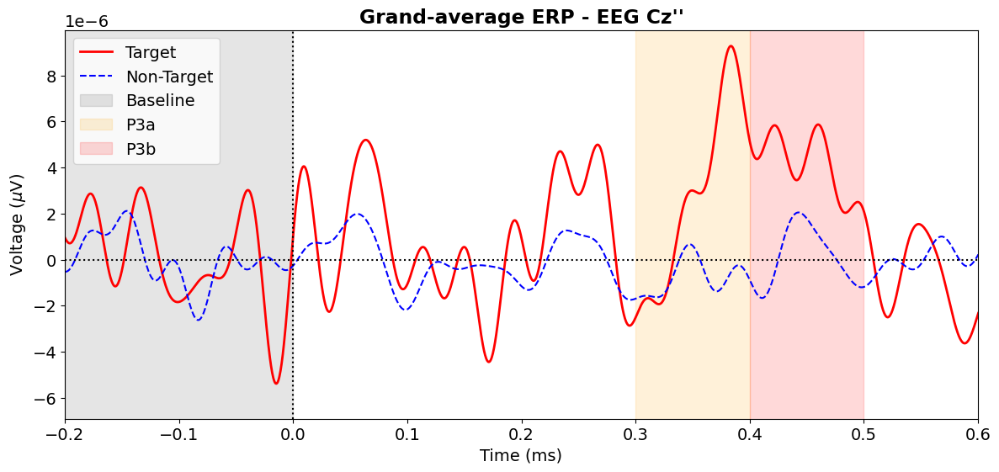

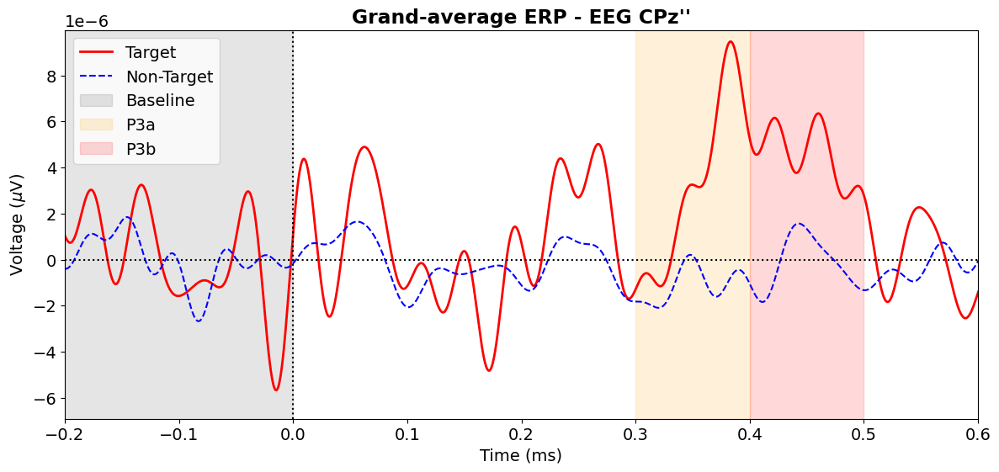

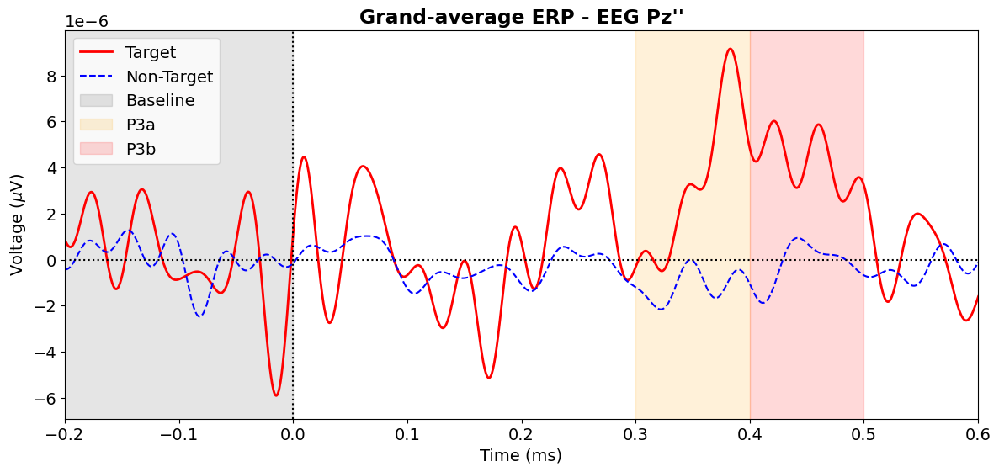

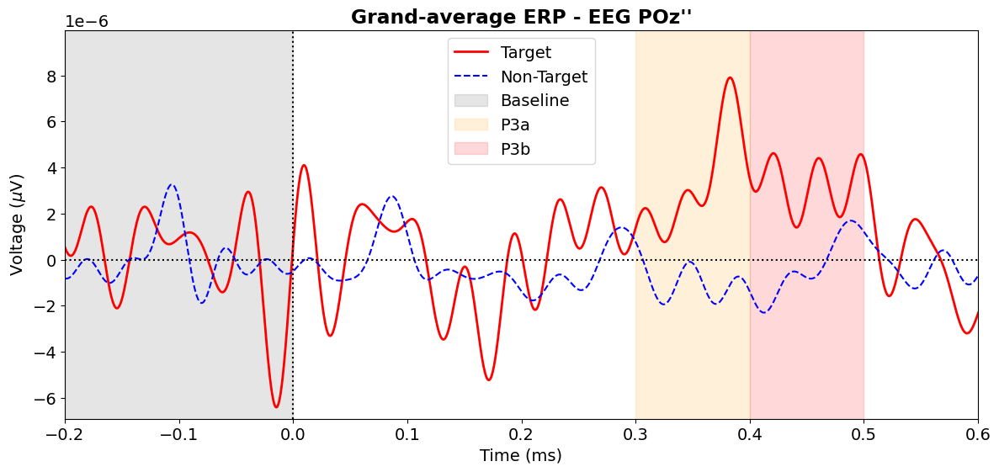

In [94]:
import matplotlib.patches as patches

for c in P3_ch_idx:
    fig, ax = plt.subplots(figsize=(14, 6))
    plt.plot(ERP_times, target_ERP[c], color = 'red', label = 'Target',  linewidth = 2);
    plt.plot(ERP_times, nontarget_ERP[c], 'b--', label = 'Non-Target');
    plt.title(f"Grand-average ERP - {ch[c]}", weight = 'bold')
    plt.xlabel("Time (ms)")
    plt.ylabel("Voltage ($\mu$V)")
    plt.axvline(x = 0, linestyle = ':', color = 'black')
    plt.axhline(y = 0, linestyle = ':', color = 'black')
    plt.xlim([preStim_offset,posStim_offset])
    plt.ylim([np.min(target_ERP[P3_ch_idx]) - 0.5 * 10**(-6),np.max(target_ERP[P3_ch_idx]) + 0.5 * 10**(-6)])
    baseline_region = patches.Rectangle((-0.2, -0.1), 0.2, 0.2, linewidth = 1, edgecolor = 'black', facecolor = 'black', alpha = 0.1, label = 'Baseline')
    ax.add_patch(baseline_region)
    if c in P3_ch_idx:
        '''
        ----- Patches info: -----
        (200, -1) is the bottom-left corner of the rectangle (x, y coordinates). Note the y values in the graph are in microVolts
        0.1 is the width of the rectangle.
        0.2 is the height of the rectangle.
        '''
        P3a_region = patches.Rectangle((0.3, -0.1), 0.1, 0.2, linewidth=1, edgecolor='orange', facecolor='orange', alpha=0.15, label = 'P3a')
        ax.add_patch(P3a_region)
        P3b_region = patches.Rectangle((0.4, -0.1), 0.1, 0.2, linewidth=1, edgecolor='red', facecolor='red', alpha=0.15, label = 'P3b')
        ax.add_patch(P3b_region)
    plt.legend()
    plt.show()

# **Mapping targets to object location**

In [95]:
trial_order_folder = "C:/Users/migue/OneDrive/Ambiente de Trabalho/Tese/AcquisitionProtocols/RealDroneImg_Protocol/Stim_Order_Files/EEG_Sara_001"
subfolders, trialfiles = run_fast_scandir(trial_order_folder, [".xlsx"])

import natsort
sort_trialfiles = natsort.natsorted(trialfiles)

In [96]:
import pandas as pd

centroid_mapped_targets = []
images = []

count = 0

for file in sort_trialfiles:
    sheet = pd.read_excel(file)
    
    for row in sheet.values:
        if row[2] == "Target":
            centroid_mapped_targets.append([baseline_corr_targets[count], row[-1]]) # Mapping rows || Field one comprises the data | Field two comprises the object centroid 
            images.append(row[1]) # row[0] = trial iterator
            count = count + 1

## Visual angle calculation

In [97]:
SCREEN_WIDTH_PX = 1920
SCREEN_HEIGHT_PX = 1080

SCREEN_DIAGONAL_SIZE_INCH = 27

def visual_angle(object_x_px, object_y_px, H_image_width_px, V_image_width_px, screen_width_px, screen_height_px):
    
    # https://www.reddit.com/r/oculus/comments/1dmcsh/default_eye_to_screen_distance/ corresponds to measurement
    #observer_distance_mm = 40 # in mm for the HMD (Oculus Rift)
    OBSERVER_DISTANCE_MM = 1000 # in mm for the C1 computer

    # Width and Height of the screen in mm
    SCREEN_WIDTH_MM = 699
    SCREEN_HEIGHT_MM = 395
 
    # Convert the size of the image in pixels to mm
    H_image_width_mm = (SCREEN_WIDTH_MM * H_image_width_px)/screen_width_px
    V_image_width_mm = (SCREEN_HEIGHT_MM * V_image_width_px)/screen_height_px

    # Visual angle of the image
    H_image_width_deg = np.degrees(2 * (np.arctan(H_image_width_mm / (OBSERVER_DISTANCE_MM * 2))))
    V_image_width_deg = np.degrees(2 * (np.arctan(V_image_width_mm / (OBSERVER_DISTANCE_MM * 2))))

    # How many degrees in the visual field represents one pixel in the images
    H_visual_angle_per_px = H_image_width_deg / H_image_width_px 
    V_visual_angle_per_px = V_image_width_deg / V_image_width_px

    H_object_x_deg = (object_x_px - (H_image_width_px / 2)) * H_visual_angle_per_px
    V_object_y_deg = (object_y_px - (V_image_width_px / 2)) * V_visual_angle_per_px

    return H_object_x_deg, V_object_y_deg

In [98]:
x,y=visual_angle(1344/2, 1134/2, 1344/2, 1134/2, SCREEN_WIDTH_PX, SCREEN_HEIGHT_PX)
print(x,y)

6.974058729692531 5.91970218693015


In [99]:
# This is for the PsycgoPy -> trial -> trialImage -> Layout -> Size[w,h] $
wPx = 1344
hPx = 1134

print(f"Size [{round(wPx * 0.5 / hPx, 3)}, 0.5]") # This mantains the proportion of width and height in the scalling done in PsychoPy

wPx = wPx * 0.5 # px
hPx = hPx * 0.5 # px

# Now we have to define how to devide the visual field for the VR headset
# In the original study had a width of 11.5 x 11.8 degrees and 640 x 640 in pixels. 
# Also, a threshold of +/- 1.2 degrees to classify the images for the LVF and RVF 

#observer_distance_mm = 40
OBSERVER_DISTANCE_MM = 1000

# Inches to mm the screen size
screen_diagonal_size_mm = SCREEN_DIAGONAL_SIZE_INCH * 25.4 

# Angle of the diagonal of the screen
width_height_angle = np.arctan(SCREEN_HEIGHT_PX/SCREEN_WIDTH_PX) # C_oposed/C_adjacent

# Width and Height of the screen in mm
screen_width_mm = 696
screen_height_mm = 395

# Convert the size of the image in pixels to mm
H_image_width_mm = (screen_width_mm * wPx)/SCREEN_WIDTH_PX
V_image_width_mm = (screen_height_mm * hPx)/SCREEN_HEIGHT_PX

# Visual angle of the image
H_image_width_deg = np.degrees(2 * (np.arctan(H_image_width_mm / (OBSERVER_DISTANCE_MM * 2))))
V_image_width_deg = np.degrees(2 * (np.arctan(V_image_width_mm / (OBSERVER_DISTANCE_MM * 2))))

print("\nWidth of the image in degrees: ", round(H_image_width_deg,3))
print("Height of the image in degrees: ", round(V_image_width_deg,3))

# Paper on Eccentricity of the target stimuli and the N2pc performance: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7160023/pdf/nihms-1065363.pdf 

Size [0.593, 0.5]

Width of the image in degrees:  13.889
Height of the image in degrees:  11.839


## Labelling targets according to the centroid location

In [100]:
import re

H_th = 1.2 # Degrees
V_th = 1.2

PYSCHOPY_RESCALLING = 0.5

IM_WIDTH = 1344 * PYSCHOPY_RESCALLING
IM_HEIGHT = 1134 * PYSCHOPY_RESCALLING

labelled_targets = []

for count, (target_EEG, centroid_str) in enumerate(centroid_mapped_targets):

    # Remove unnecessary characters and split by comma
    cleaned_string = centroid_str[2:-2].split(",")  # Removes [' and '] and splits at ','
    # Extract integers after '=' sign
    centroid = [int(s.split("=")[1]) for s in cleaned_string]

    x_VA, y_VA = visual_angle(centroid[0], centroid[1], IM_WIDTH, IM_HEIGHT, SCREEN_WIDTH_PX, SCREEN_HEIGHT_PX)

    if (x_VA > H_th):
        x_stim_type = "RVF"
    elif (x_VA < -H_th):
        x_stim_type = "LVF"
    else:
        x_stim_type = "CVF"

    if(y_VA > V_th):
        y_stim_type = "TVF"
    elif (y_VA < -V_th):
        y_stim_type = "BVF"
    else:
        y_stim_type = "CVF"

    labelled_targets.append([target_EEG, centroid[0], centroid[1], x_VA, y_VA, x_stim_type, y_stim_type])

print(np.shape(labelled_targets))
           

(210, 7)


c:\Users\migue\anaconda3\envs\BCI\lib\site-packages\numpy\core\fromnumeric.py:2009: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


# **Averaging Contralateral - Ipsilateral component: N2pc (200 - 400 ms)**

## Separating and concatenating classes

In [101]:
left_N2pc_channels = [" P7", " PO7", " P5", " PO5", " P3", " PO3", " O1"]
right_N2pc_channels = [" P8", " PO8", " P6", " PO6", " P4", " PO4", " O2"]

left_N2pc_ch_idx = pick_channels(ch, left_N2pc_channels)
right_N2pc_ch_idx = pick_channels(ch, right_N2pc_channels)

LVF_contralateral = []
LVF_ipsilateral = []
RVF_contralateral = []
RVF_ipsilateral = []
CVF_contralateral = []
CVF_ipsilateral = []

RVF_x_pos = []
LVF_x_pos = []
CVF_x_pos = []

HORIZONTAL_CONDITION_COL = 5
HORIZONTAL_VA_COL = 3
X_CENTROID_COL = 1
DATA_COL = 0

for trial in labelled_targets:
    if(trial[HORIZONTAL_CONDITION_COL] == "RVF"):
        RVF_contralateral.append(trial[DATA_COL][left_N2pc_ch_idx,:])
        RVF_ipsilateral.append(trial[DATA_COL][right_N2pc_ch_idx,:])
        RVF_x_pos.append(trial[X_CENTROID_COL])
    elif(trial[HORIZONTAL_CONDITION_COL] == "LVF"):
        LVF_contralateral.append(trial[DATA_COL][right_N2pc_ch_idx,:])
        LVF_ipsilateral.append(trial[DATA_COL][left_N2pc_ch_idx,:])
        LVF_x_pos.append(trial[X_CENTROID_COL])
    elif(trial[HORIZONTAL_CONDITION_COL] == "CVF" and trial[HORIZONTAL_VA_COL >= -H_th] and trial[HORIZONTAL_VA_COL] < 0):
        CVF_contralateral.append(trial[DATA_COL][right_N2pc_ch_idx,:])
        CVF_ipsilateral.append(trial[DATA_COL][left_N2pc_ch_idx,:])
        CVF_x_pos.append(trial[X_CENTROID_COL])
    elif(trial[HORIZONTAL_CONDITION_COL] == "CVF" and trial[HORIZONTAL_VA_COL > 0] and trial[HORIZONTAL_VA_COL] <= H_th):
        CVF_contralateral.append(trial[DATA_COL][left_N2pc_ch_idx,:])
        CVF_ipsilateral.append(trial[DATA_COL][right_N2pc_ch_idx,:])
        CVF_x_pos.append(trial[X_CENTROID_COL])


In [102]:
print("RVF Contralateral trial number:", np.shape(RVF_contralateral))
print("RVF Ipsilateral trial number:", np.shape(RVF_ipsilateral))
print("LVF Contralateral trial number:", np.shape(LVF_contralateral))
print("LVF Ipsilateral trial number:", np.shape(LVF_ipsilateral))
print("CVF Contralateral trial number:", np.shape(CVF_contralateral))
print("CVF Ipsilateral trial number:", np.shape(CVF_ipsilateral))


RVF Contralateral trial number: (70, 7, 1640)
RVF Ipsilateral trial number: (70, 7, 1640)
LVF Contralateral trial number: (70, 7, 1640)
LVF Ipsilateral trial number: (70, 7, 1640)
CVF Contralateral trial number: (70, 7, 1640)
CVF Ipsilateral trial number: (70, 7, 1640)


## Grand-Average

In [103]:
RVF_aver_contralateral = np.mean(RVF_contralateral, axis = 0)
RVF_aver_ipsilateral = np.mean(RVF_ipsilateral, axis = 0)
LVF_aver_contralateral = np.mean(LVF_contralateral, axis = 0)
LVF_aver_ipsilateral = np.mean(LVF_ipsilateral, axis = 0)

aver_cont = (RVF_aver_contralateral + LVF_aver_contralateral)/2
aver_ipsi = (RVF_aver_ipsilateral + LVF_aver_ipsilateral)/2

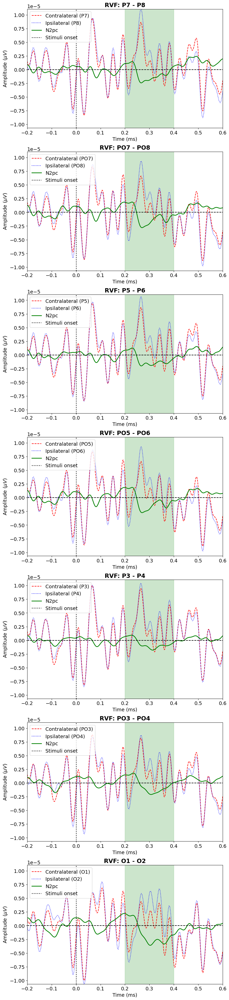

In [104]:
fig, ax = plt.subplots(figsize=(10, 50), nrows=7, ncols=1)

pos = [[0, 0], [1, 0], [2, 0], [3,0], [4,0], [5,0], [6,0]]

for i in range(len(left_N2pc_ch_idx)):
    ax[pos[i][0]].plot(ERP_times, RVF_aver_contralateral[i],'r--', label = f"Contralateral ({clean_ch[left_N2pc_ch_idx[i]]})")
    ax[pos[i][0]].plot(ERP_times, RVF_aver_ipsilateral[i],'b:', label = f"Ipsilateral ({clean_ch[right_N2pc_ch_idx[i]]})")
    ax[pos[i][0]].plot(ERP_times, RVF_aver_contralateral[i] - RVF_aver_ipsilateral[i],'g', label = 'N2pc', linewidth = 2)
    ax[pos[i][0]].axvline(x=0, color = 'k', label = 'Stimuli onset', linestyle='dotted', linewidth = 2)
    ax[pos[i][0]].axhline(y=0, color = 'k', linestyle = 'dashed')
    ax[pos[i][0]].set_xlim([np.min(ERP_times),np.max(ERP_times)])
    ax[pos[i][0]].set_ylim([np.min(RVF_aver_ipsilateral),np.max(RVF_aver_ipsilateral)])

    N2pc_region = patches.Rectangle((0.2, -0.1), 0.2, 0.2, linewidth=1, edgecolor='g', facecolor='g', alpha=0.2)
    # - `(200, -1)` is the bottom-left corner of the rectangle (x, y coordinates). Note the y values in the graph are in microVolts
    # - `200` is the width of the rectangle.
    # - `2` is the height of the rectangle.

    ax[pos[i][0]].add_patch(N2pc_region)

    ax[pos[i][0]].set_title(f"RVF: {clean_ch[left_N2pc_ch_idx[i]]} - {clean_ch[right_N2pc_ch_idx[i]]}", fontweight = 'bold')
    ax[pos[i][0]].set_xlabel('Time (ms)')
    ax[pos[i][0]].set_ylabel('Amplitude ($\mu V$)')
    ax[pos[i][0]].legend(loc='upper left')

    #ax[pos[i][0],pos[i][1]].invert_yaxis()

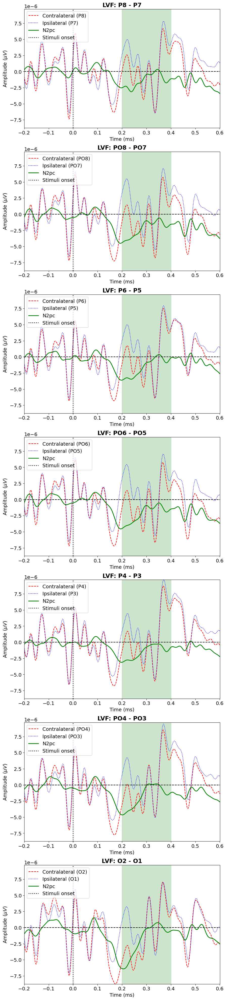

In [105]:
fig, ax = plt.subplots(figsize=(10, 50), nrows=7, ncols=1)

for i in range(len(left_N2pc_ch_idx)):

    ax[pos[i][0]].plot(ERP_times, LVF_aver_contralateral[i],'r--', label = f"Contralateral ({clean_ch[right_N2pc_ch_idx[i]]})")
    ax[pos[i][0]].plot(ERP_times, LVF_aver_ipsilateral[i],'b:', label = f"Ipsilateral ({clean_ch[left_N2pc_ch_idx[i]]})")
    ax[pos[i][0]].plot(ERP_times, LVF_aver_contralateral[i] - LVF_aver_ipsilateral[i],'g', label = 'N2pc', linewidth = 2)
    ax[pos[i][0]].axvline(x=0, color = 'k', label = 'Stimuli onset', linestyle='dotted', linewidth = 2)
    ax[pos[i][0]].axhline(y=0, color = 'k', linestyle = 'dashed')

    ax[pos[i][0]].set_xlim([np.min(ERP_times),np.max(ERP_times)])
    ax[pos[i][0]].set_ylim([np.min(LVF_aver_contralateral),np.max(LVF_aver_ipsilateral)])

    N2pc_region = patches.Rectangle((0.2, -0.1), 0.2, 0.2, linewidth=1, edgecolor='g', facecolor='g', alpha=0.2)
    # - `(200, -1)` is the bottom-left corner of the rectangle (x, y coordinates). Note the y values in the graph are in microVolts
    # - `200` is the width of the rectangle.
    # - `2` is the height of the rectangle.

    ax[pos[i][0]].add_patch(N2pc_region)

    ax[pos[i][0]].set_title(f"LVF: {clean_ch[right_N2pc_ch_idx[i]]} - {clean_ch[left_N2pc_ch_idx[i]]}", fontweight = 'bold')
    ax[pos[i][0]].set_xlabel('Time (ms)')
    ax[pos[i][0]].set_ylabel('Amplitude ($\mu V$)')
    ax[pos[i][0]].legend(loc='upper left')

    #ax[pos[i][0],pos[i][1]].invert_yaxis()

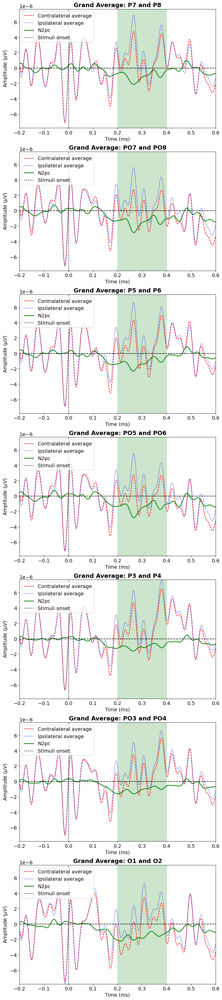

In [106]:
fig, ax = plt.subplots(figsize=(10, 50), nrows=7, ncols=1)

for i in range(len(left_N2pc_ch_idx)):

    ax[pos[i][0]].plot(ERP_times, aver_cont[i],'r--', label = 'Contralateral average')
    ax[pos[i][0]].plot(ERP_times, aver_ipsi[i],'b:', label = 'Ipsilateral average')
    ax[pos[i][0]].plot(ERP_times, aver_cont[i] - aver_ipsi[i],'g', label = 'N2pc', linewidth = 2)
    ax[pos[i][0]].axvline(x=0, color = 'k', label = 'Stimuli onset', linestyle='dotted', linewidth = 2)
    ax[pos[i][0]].axhline(y=0, color = 'k', linestyle = 'dashed')

    ax[pos[i][0]].set_xlim([np.min(ERP_times), np.max(ERP_times)])
    ax[pos[i][0]].set_ylim([np.min(aver_ipsi), np.max(aver_ipsi)])

    N2pc_region = patches.Rectangle((0.2, -0.1), 0.2, 0.2, linewidth=1, edgecolor='g', facecolor='g', alpha=0.2)    # - `(200, -1)` is the bottom-left corner of the rectangle (x, y coordinates). Note the y values in the graph are in microVolts
    # - `200` is the width of the rectangle.
    # - `2` is the height of the rectangle.

    ax[pos[i][0]].add_patch(N2pc_region)

    ax[pos[i][0]].set_title(f"Grand Average: {clean_ch[left_N2pc_ch_idx[i]]} and {clean_ch[right_N2pc_ch_idx[i]]}", fontweight = 'bold')
    ax[pos[i][0]].set_xlabel('Time (ms)')
    ax[pos[i][0]].set_ylabel('Amplitude ($\mu V$)')
    ax[pos[i][0]].legend(loc='upper left')

    #ax[pos[i][0],pos[i][1]].invert_yaxis()

## Calculate the single-trial N2pc component

In [107]:
from scipy.signal import resample

# Isolating the datapoints related to the N2pc time window 

n_trials, n_channels, _ = np.shape(RVF_contralateral)

ts = 0.2
te = 0.4

idx_s = np.argmin(np.abs(ERP_times - ts))
idx_e = np.argmin(np.abs(ERP_times - te))

# Resampling the resulting time window (Prevents overfitting)

RESAMPLE_FREQ = 64 # Hz
N_DATAPOINTS_ORIG_FREQ = len(ERP_times[idx_s:idx_e+1])
N_DATAPOINTS_RESA_FREQ = int(np.ceil((N_DATAPOINTS_ORIG_FREQ * RESAMPLE_FREQ)/fs))

CVF = [] # Class label = 2
LVF = [] # Class label = 0
RVF = [] # Class label = 1

featVectCVF = []
featVectLVF = []
featVectRVF = []

NN_featVectCVF = []
NN_featVectLVF = []
NN_featVectRVF = []

for trial in range(n_trials):

    CVF = resample(CVF_contralateral[trial][:,idx_s:idx_e+1] - CVF_ipsilateral[trial][:,idx_s:idx_e+1], N_DATAPOINTS_RESA_FREQ, axis = -1)
    LVF = resample(LVF_contralateral[trial][:,idx_s:idx_e+1] - LVF_ipsilateral[trial][:,idx_s:idx_e+1], N_DATAPOINTS_RESA_FREQ, axis = -1)
    RVF = resample(RVF_contralateral[trial][:,idx_s:idx_e+1] - RVF_ipsilateral[trial][:,idx_s:idx_e+1], N_DATAPOINTS_RESA_FREQ, axis = -1)
    
    for c in range(1, n_channels):

        if (c == 1):
            auxCVF = np.hstack((CVF[c-1,:],CVF[c,:]))
            auxLVF = np.hstack((LVF[c-1,:],LVF[c,:]))
            auxRVF = np.hstack((RVF[c-1,:],RVF[c,:]))
        else:
            auxCVF = np.hstack((auxCVF,CVF[c,:]))
            auxLVF = np.hstack((auxLVF,LVF[c,:]))
            auxRVF = np.hstack((auxRVF,RVF[c,:]))
    
    '''
    if(trial >= 0 and trial <= 30):
        plt.plot(LVF[0], "b:", label = "LVF")
        plt.plot(RVF[0], "r", label = "RVF")
        plt.legend()
        plt.show()
    '''

    featVectCVF.append(np.hstack((auxCVF, 2)))
    featVectLVF.append(np.hstack((auxLVF, 0)))
    featVectRVF.append(np.hstack((auxRVF, 1)))

    NN_featVectCVF.append(np.hstack((auxCVF, CVF_x_pos[trial])))
    NN_featVectLVF.append(np.hstack((auxLVF, LVF_x_pos[trial])))
    NN_featVectRVF.append(np.hstack((auxRVF, RVF_x_pos[trial])))

print(np.shape(featVectCVF))
print(np.shape(featVectLVF))
print(np.shape(featVectRVF))

(70, 92)
(70, 92)
(70, 92)


# **Classifying N2pc: RVF vs LVF**

## Train/Test Split and concatenate feature vectors for all channel differences

In [108]:
import random

PERCENT_TRAIN = 0.75

n_train = int(np.ceil(n_trials * PERCENT_TRAIN))

train_featVect = np.vstack((featVectLVF[:n_train], featVectRVF[:n_train]))
test_featVect = np.vstack((featVectLVF[n_train:], featVectRVF[n_train:]))

random.seed(42)
np.random.shuffle(train_featVect)
random.seed(42)
np.random.shuffle(test_featVect)


## Mutual Based Information

In [109]:
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import SelectKBest

k_feat = N_DATAPOINTS_RESA_FREQ * 3

best_feat_idx = SelectKBest(mutual_info_classif, k = k_feat).fit(train_featVect[:,0:-1], train_featVect[:,-1]).get_support()
best_feat_idx = np.append(best_feat_idx, False)

### Distribution of channel importance for classification

In [110]:
n_ch = len(right_N2pc_ch_idx)

tf = np.zeros(n_ch)
cont = np.ones(N_DATAPOINTS_RESA_FREQ)

for i in range(n_ch):
    tf[i] = (np.sum(cont[best_feat_idx[i*N_DATAPOINTS_RESA_FREQ:i*N_DATAPOINTS_RESA_FREQ+N_DATAPOINTS_RESA_FREQ]]))

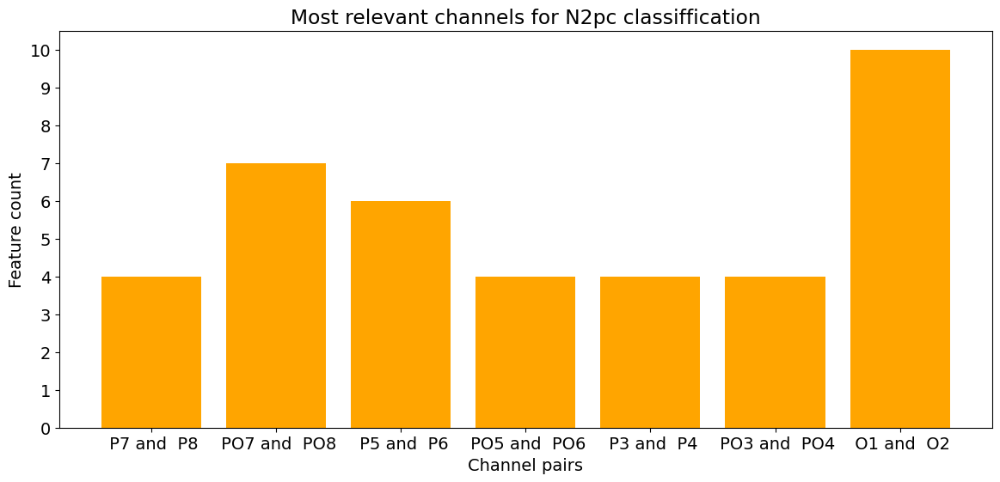

In [111]:
customlb = []
for c, lb in enumerate(left_N2pc_channels):
    customlb.append(str(lb) + " and " + str(right_N2pc_channels[c]))

fig, ax = plt.subplots(figsize=(14, 6))
plt.rcParams.update({'font.size': 14})
ax.set_title(f'Most relevant channels for N2pc classiffication')
ax.bar(np.arange(1, n_ch + 1), tf, color="orange", capsize=4)
ax.set(xticks=np.arange(1, n_ch + 1), 
       xlabel='Channel pairs', 
       yticks=np.arange(0, max(tf) + 1, step=1),
       ylabel = "Feature count")
ax.set_xticklabels(customlb);

### Selecting the most relevant channel for classification

In [112]:
best_channel_feat_idx = np.zeros(len(best_feat_idx))

for i in range(len(tf)):
    if(tf[i] >= sorted(tf, reverse = True)[2]):
        best_channel_feat_idx[i * N_DATAPOINTS_RESA_FREQ:i * N_DATAPOINTS_RESA_FREQ + N_DATAPOINTS_RESA_FREQ] = 1
    else:
        best_channel_feat_idx[i * N_DATAPOINTS_RESA_FREQ: i * N_DATAPOINTS_RESA_FREQ + N_DATAPOINTS_RESA_FREQ] = 0

best_channel_feat_idx = best_channel_feat_idx != 0 # Convert to boolean
best_channel_feat_idx

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False])

## Classification models

#### Most dicriminative channels

In [113]:
from sklearn.svm import SVC
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb
from sklearn.ensemble import AdaBoostClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score, accuracy_score

kfold = 10

print("Most dicriminative channels\n")

# SVM
kernel = 'sigmoid'
clf1 = SVC(kernel=kernel, probability=True)
scores = cross_val_score(clf1, train_featVect[:, best_channel_feat_idx], train_featVect[:, -1], cv=kfold)
clf1.fit(train_featVect[:, best_channel_feat_idx], train_featVect[:, -1])
pred = clf1.predict(test_featVect[:, best_channel_feat_idx])
print("------------- SVM -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf1.predict_proba(test_featVect[:, best_channel_feat_idx])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# LDA
clf2 = LDA()
scores = cross_val_score(clf2, train_featVect[:, best_channel_feat_idx], train_featVect[:, -1], cv=kfold)
clf2.fit(train_featVect[:, best_channel_feat_idx], train_featVect[:, -1])
pred = clf2.predict(test_featVect[:, best_channel_feat_idx])
print("\n------------- LDA -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf2.predict_proba(test_featVect[:, best_channel_feat_idx])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# Random Forest
clf3 = RandomForestClassifier()  # Create an instance of Random Forest classifier
scores = cross_val_score(clf3, train_featVect[:, best_channel_feat_idx], train_featVect[:, -1], cv=kfold)
clf3.fit(train_featVect[:, best_channel_feat_idx], train_featVect[:, -1])
pred = clf3.predict(test_featVect[:, best_channel_feat_idx])
print("\n------------- Random Forest -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf3.predict_proba(test_featVect[:, best_channel_feat_idx])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# XGBoost
clf4 = xgb.XGBClassifier()  # Create an instance of XGBoost classifier
scores = cross_val_score(clf4, train_featVect[:, best_channel_feat_idx], train_featVect[:, -1], cv=kfold)
clf4.fit(train_featVect[:, best_channel_feat_idx], train_featVect[:, -1])
pred = clf4.predict(test_featVect[:, best_channel_feat_idx])
print("\n------------- XGBoost -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf4.predict_proba(test_featVect[:,best_channel_feat_idx])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# Adaboost
clf5 = AdaBoostClassifier()  # Create an instance of AdaBoost classifier
scores = cross_val_score(clf5, train_featVect[:, best_channel_feat_idx], train_featVect[:, -1], cv=kfold)
clf5.fit(train_featVect[:, best_channel_feat_idx], train_featVect[:, -1])
pred = clf5.predict(test_featVect[:, best_channel_feat_idx])
print("\n------------- AdaBoost -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf5.predict_proba(test_featVect[:, best_channel_feat_idx])[:,1]),2)) # [:,1] is related to the column of probability predictions of the second class (1). [:,0] would be the first (0)
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))



Most dicriminative channels

------------- SVM -------------
AUC:  0.96
Cross validation mean score: 0.79 +/- 0.11
Accuracy:  0.88

------------- LDA -------------
AUC:  0.99
Cross validation mean score: 0.85 +/- 0.12
Accuracy:  0.91

------------- Random Forest -------------
AUC:  0.93
Cross validation mean score: 0.8 +/- 0.1
Accuracy:  0.79

------------- XGBoost -------------
AUC:  0.92
Cross validation mean score: 0.81 +/- 0.11
Accuracy:  0.88

------------- AdaBoost -------------
AUC:  0.91
Cross validation mean score: 0.77 +/- 0.11
Accuracy:  0.79


#### Most dicriminative features

In [114]:
print("Most dicriminative features\n")

# SVM
kernel = 'sigmoid'
clf6 = SVC(kernel=kernel, probability=True)
scores = cross_val_score(clf6, train_featVect[:, best_feat_idx], train_featVect[:, -1], cv=kfold)
clf6.fit(train_featVect[:, best_feat_idx], train_featVect[:, -1])
pred = clf6.predict(test_featVect[:, best_feat_idx])
print("------------- SVM -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf6.predict_proba(test_featVect[:, best_feat_idx])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# LDA
clf7 = LDA()
scores = cross_val_score(clf7, train_featVect[:, best_feat_idx], train_featVect[:, -1], cv=kfold)
clf7.fit(train_featVect[:, best_feat_idx], train_featVect[:, -1])
pred = clf7.predict(test_featVect[:, best_feat_idx])
print("\n------------- LDA -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf7.predict_proba(test_featVect[:, best_feat_idx])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# Random Forest
clf8 = RandomForestClassifier()  # Create an instance of Random Forest classifier
scores = cross_val_score(clf8, train_featVect[:, best_feat_idx], train_featVect[:, -1], cv=kfold)
clf8.fit(train_featVect[:, best_feat_idx], train_featVect[:, -1])
pred = clf8.predict(test_featVect[:, best_feat_idx])
print("\n------------- Random Forest -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf8.predict_proba(test_featVect[:, best_feat_idx])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# XGBoost
clf9 = xgb.XGBClassifier()  # Create an instance of XGBoost classifier
scores = cross_val_score(clf9, train_featVect[:, best_feat_idx], train_featVect[:, -1], cv=kfold)
clf9.fit(train_featVect[:, best_feat_idx], train_featVect[:, -1])
pred = clf9.predict(test_featVect[:, best_feat_idx])
print("\n------------- XGBoost -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf9.predict_proba(test_featVect[:,best_feat_idx])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# Adaboost
clf10 = AdaBoostClassifier()  # Create an instance of AdaBoost classifier
scores = cross_val_score(clf10, train_featVect[:, best_feat_idx], train_featVect[:, -1], cv=kfold)
clf10.fit(train_featVect[:, best_feat_idx], train_featVect[:, -1])
pred = clf10.predict(test_featVect[:, best_feat_idx])
print("\n------------- AdaBoost -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf10.predict_proba(test_featVect[:, best_feat_idx])[:,1]),2)) # [:,1] is related to the column of probability predictions of the second class (1). [:,0] would be the first (0)
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

Most dicriminative features

------------- SVM -------------
AUC:  0.93
Cross validation mean score: 0.8 +/- 0.11
Accuracy:  0.82

------------- LDA -------------
AUC:  0.96
Cross validation mean score: 0.89 +/- 0.08
Accuracy:  0.91

------------- Random Forest -------------
AUC:  0.94
Cross validation mean score: 0.8 +/- 0.09
Accuracy:  0.82

------------- XGBoost -------------
AUC:  0.91
Cross validation mean score: 0.8 +/- 0.11
Accuracy:  0.88

------------- AdaBoost -------------
AUC:  0.92
Cross validation mean score: 0.77 +/- 0.09
Accuracy:  0.82


#### All features (channel differences)

In [115]:
print("All features (channel differences)\n")

# SVM
kernel = 'sigmoid'
clf11 = SVC(kernel=kernel, probability=True)
scores = cross_val_score(clf11, train_featVect[:, 0:-1], train_featVect[:, -1], cv=kfold)
clf11.fit(train_featVect[:, 0:-1], train_featVect[:, -1])
pred = clf11.predict(test_featVect[:, 0:-1])
print("------------- SVM -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf11.predict_proba(test_featVect[:, 0:-1])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# LDA
clf12 = LDA()
scores = cross_val_score(clf12, train_featVect[:, 0:-1], train_featVect[:, -1], cv=kfold)
clf12.fit(train_featVect[:, 0:-1], train_featVect[:, -1])
pred = clf12.predict(test_featVect[:, 0:-1])
print("\n------------- LDA -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf12.predict_proba(test_featVect[:, 0:-1])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# Random Forest
clf13 = RandomForestClassifier()  # Create an instance of Random Forest classifier
scores = cross_val_score(clf13, train_featVect[:, 0:-1], train_featVect[:, -1], cv=kfold)
clf13.fit(train_featVect[:, 0:-1], train_featVect[:, -1])
pred = clf13.predict(test_featVect[:, 0:-1])
print("\n------------- Random Forest -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf13.predict_proba(test_featVect[:, 0:-1])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# XGBoost
clf14 = xgb.XGBClassifier()  # Create an instance of XGBoost classifier
scores = cross_val_score(clf14, train_featVect[:, 0:-1], train_featVect[:, -1], cv=kfold)
clf14.fit(train_featVect[:, 0:-1], train_featVect[:, -1])
pred = clf14.predict(test_featVect[:, 0:-1])
print("\n------------- XGBoost -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf14.predict_proba(test_featVect[:,0:-1])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# Adaboost
clf15 = AdaBoostClassifier()  # Create an instance of AdaBoost classifier
scores = cross_val_score(clf15, train_featVect[:, 0:-1], train_featVect[:, -1], cv=kfold)
clf15.fit(train_featVect[:, 0:-1], train_featVect[:, -1])
pred = clf15.predict(test_featVect[:, 0:-1])
print("\n------------- AdaBoost -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf15.predict_proba(test_featVect[:, 0:-1])[:,1]),2)) # [:,1] is related to the column of probability predictions of the second class (1). [:,0] would be the first (0)
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

All features (channel differences)

------------- SVM -------------
AUC:  0.96
Cross validation mean score: 0.79 +/- 0.12
Accuracy:  0.85

------------- LDA -------------
AUC:  0.8
Cross validation mean score: 0.68 +/- 0.14
Accuracy:  0.74

------------- Random Forest -------------
AUC:  0.89
Cross validation mean score: 0.79 +/- 0.11
Accuracy:  0.74

------------- XGBoost -------------
AUC:  0.9
Cross validation mean score: 0.84 +/- 0.07
Accuracy:  0.79

------------- AdaBoost -------------
AUC:  0.94
Cross validation mean score: 0.84 +/- 0.09
Accuracy:  0.82


# **Deep Learning - Estimating the target object along the x axis in the images (N2pc)**

In [116]:
import torch
from torch import nn

# Make device agnostic code
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cpu'

## NN model

In [117]:
torch.manual_seed(42)

class N2pcModel(nn.Module):
    def __init__(self, input_features, output_features, hidden_units=8):
        """Initializes all required hyperparameters for a multi-class classification model.

        Args:
            input_features (int): Number of input features to the model.
            out_features (int): Number of output features of the model
              (how many classes there are).
            hidden_units (int): Number of hidden units between layers, default 8.
        """
        super().__init__()
        self.linear_layer_stack = nn.Sequential(
            nn.Linear(in_features=input_features, out_features=hidden_units),
            nn.Sigmoid(), 
            nn.Linear(in_features=hidden_units, out_features=hidden_units),
            nn.Sigmoid(), 
            nn.Linear(in_features=hidden_units, out_features=output_features),
        )
    
    def forward(self, x):
        return self.linear_layer_stack(x)

## Training model (Most dicriminative channels)

In [118]:
# Number of features

train_featVect = np.vstack((NN_featVectRVF[:n_train], NN_featVectLVF[:n_train]))
test_featVect = np.vstack((NN_featVectRVF[n_train:], NN_featVectLVF[n_train:]))

NUM_FEATURES = np.size(train_featVect[:,best_channel_feat_idx],1) 

# Fit the model
torch.manual_seed(42)

# Set number of epochs
dl_epochs = 20000
    
# Initializing model

x_pos_model1 = N2pcModel(input_features=NUM_FEATURES, 
                output_features=1, 
                hidden_units=16).to(device)

loss_fn = nn.SmoothL1Loss()
optimizer = torch.optim.Adamax(x_pos_model1.parameters(), 
                        lr=0.005) 

# Shuffle

np.random.seed(42)
np.random.shuffle(train_featVect)
np.random.seed(42)
np.random.shuffle(test_featVect)

# Tensor convertion
tn_train_feat = torch.tensor(np.array(train_featVect[:,best_channel_feat_idx])).type(torch.float32)
tn_train_lbl = torch.tensor(np.array(train_featVect[:,-1])).type(torch.float32)

tn_test_feat = torch.tensor(np.array(test_featVect[:,best_channel_feat_idx])).type(torch.float32)
tn_test_lbl = torch.tensor(np.array(test_featVect[:,-1])).type(torch.float32)

# Feature wise normalization of feature vector
n_entries, n_feat = tn_train_feat.size()

for j in range(n_entries):

    mean = tn_train_feat[j,:].mean(dim=0)
    std = tn_train_feat[j,:].std(dim=0)
    tn_train_feat[j,:] = (tn_train_feat[j,:] - mean) / std

n_entries, n_feat = tn_test_feat.size()

for u in range(n_entries):

    mean = tn_test_feat[u,:].mean(dim=0)
    std = tn_test_feat[u,:].std(dim=0)
    tn_test_feat[u,:] = (tn_test_feat[u,:] - mean) / std

training_losses = []
testing_losses = []

for dl_epoch in range(dl_epochs):
    ### Training
    x_pos_model1.train()

    # 1. Forward pass
    x_pos_ = x_pos_model1(tn_train_feat)

    # 2. Calculate loss
    train_loss = loss_fn(torch.squeeze(x_pos_), tn_train_lbl) 
    training_losses.append(train_loss.detach().numpy())
  
    # 3. Optimizer zero grad
    optimizer.zero_grad()

    # 4. Loss backwards
    train_loss.backward()

    # 5. Optimizer step
    optimizer.step()

    ### Testing
    x_pos_model1.eval()
    with torch.inference_mode():
      # 1. Forward pass
      output = x_pos_model1(tn_test_feat)
      # 2. Calculate test loss and accuracy
      test_loss = loss_fn(torch.squeeze(output), tn_test_lbl)
      testing_losses.append(test_loss.detach().numpy())

    # Print out what's happening
    if (dl_epoch + 1) % 2000 == 0:
        print(f"Epoch: {dl_epoch + 1} | Training Loss: {train_loss:.5f}, | Testing Loss: {test_loss:.5f}")  

# ------------------------------------ Test ------------------------------------

# 1. Set the model in evaluation mode

x_pos_model1.eval()

# 2. Setup the inference mode context manager
with torch.inference_mode():
  x_preds = x_pos_model1(tn_test_feat)
  
x_preds = x_preds.numpy()
real_x = tn_test_lbl.numpy()

Epoch: 2000 | Training Loss: 218.96890, | Testing Loss: 225.45392
Epoch: 4000 | Training Loss: 139.13559, | Testing Loss: 181.71124
Epoch: 6000 | Training Loss: 65.84930, | Testing Loss: 127.40295
Epoch: 8000 | Training Loss: 42.73212, | Testing Loss: 107.79720
Epoch: 10000 | Training Loss: 3.04312, | Testing Loss: 92.28651
Epoch: 12000 | Training Loss: 1.28025, | Testing Loss: 98.51114
Epoch: 14000 | Training Loss: 1.19640, | Testing Loss: 98.46918
Epoch: 16000 | Training Loss: 1.15748, | Testing Loss: 97.84338
Epoch: 18000 | Training Loss: 1.12042, | Testing Loss: 97.54614
Epoch: 20000 | Training Loss: 1.08676, | Testing Loss: 97.41467


## Ploting predictions against the real values of the object's position alongisde the x-axis (Most discriminative channels)

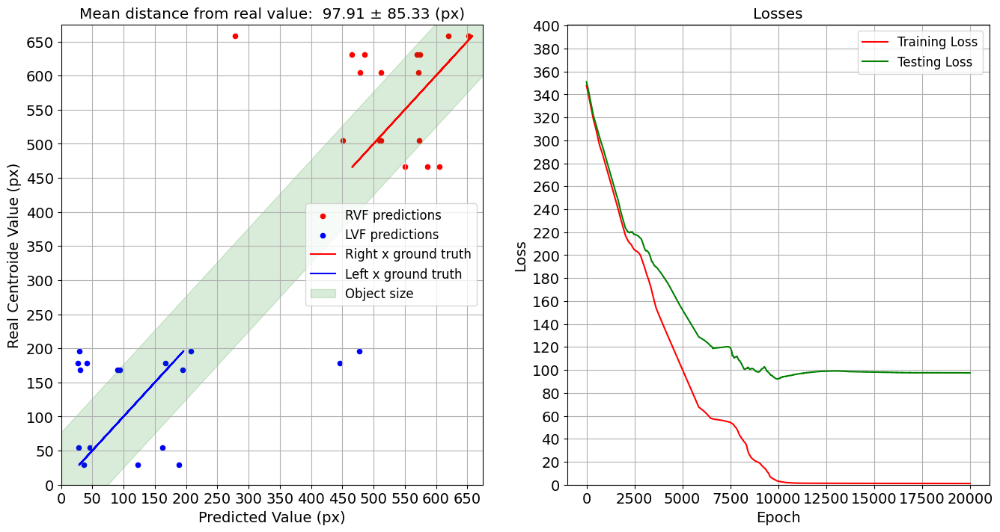

In [119]:
import math

obj_region = (IM_WIDTH * 2.9)/18.2

fig, axs = plt.subplots(nrows=1, ncols=2, figsize = (16,8))

x_losses = np.linspace(0, dl_epochs, dl_epochs)

plt.rcParams.update({'font.size': 12})

ax = axs[0]

x_preds = x_preds.reshape(len(x_preds),)

'''
Absolute error: |True value - Measured Value|
Relative error: |Absolute error / True value|
Percent  error: Relative error * 100
'''
rel_error = (np.abs(real_x - x_preds)/real_x)*100
distance = np.abs(real_x - x_preds)

RVF_real_x = [x for x in range(len(real_x)) if real_x[x] > IM_WIDTH/2]
LVF_real_x = [x for x in range(len(real_x)) if real_x[x] < IM_WIDTH/2]

# Scatter plots on the same axes
ax.scatter(x_preds[RVF_real_x], real_x[RVF_real_x], color='r', label='RVF predictions',alpha=1, s=20);
ax.scatter(x_preds[LVF_real_x], real_x[LVF_real_x], color='b', label='LVF predictions',alpha=1, s=20);

plus_minus_symbol = chr(0x00B1)
ax.set(xlabel='Predicted Value (px)', 
    xticks=np.arange(0, IM_WIDTH + 3, step = 50),
    xlim=(0, IM_WIDTH + 3),
    ylabel='Real Centroide Value (px)',
    yticks=np.arange(0, IM_WIDTH + 3, step = 50),
    ylim=(0, IM_WIDTH + 3),
    title=(f"Mean distance from real value: {np.mean(distance): .2f} {plus_minus_symbol}{np.std(distance): .2f} (px)"));
ax.grid(True)

ax.plot(real_x[RVF_real_x], real_x[RVF_real_x], 'r', alpha=1, label = 'Right x ground truth') # Line plot
ax.plot(real_x[LVF_real_x], real_x[LVF_real_x], 'b', alpha=1, label = 'Left x ground truth') 

diag_rect = patches.Rectangle(
    (min(real_x) - 50, (min(real_x))-(obj_region/2)/math.cos(math.radians(45)) - 50), 
                                max(real_x) + 400, obj_region, 
                                linewidth=1, edgecolor='g', facecolor='g', alpha=0.15, angle=45, label = 'Object size')
ax.add_patch(diag_rect) # Patch plot

ax.legend()

ax = axs[1]

ax.plot(x_losses, training_losses, 'r', label = 'Training Loss')
ax.plot(x_losses, testing_losses, 'g', label = 'Testing Loss')
ax.set(xlabel='Epoch',
        ylabel='Loss',
        yticks=np.arange(0, 401, step = 20),
        ylim=(0,401),
        title=(f"Losses"));
ax.legend(loc='upper right')
ax.grid(True)
    
plt.subplots_adjust(hspace=0.15)

## Training model (Most discriminative features)

In [120]:
# Number of features

train_featVect = np.vstack((NN_featVectRVF[:n_train], NN_featVectLVF[:n_train]))
test_featVect = np.vstack((NN_featVectRVF[n_train:], NN_featVectLVF[n_train:]))

NUM_FEATURES = np.size(train_featVect[:,best_feat_idx],1)

# Fit the model
torch.manual_seed(42)

# Set number of epochs
dl_epochs = 20000
    
# Initializing model

x_pos_model2 = N2pcModel(input_features=NUM_FEATURES, 
                output_features=1, 
                hidden_units=16).to(device)

loss_fn = nn.SmoothL1Loss()
optimizer = torch.optim.Adamax(x_pos_model2.parameters(), 
                        lr=0.005) 

# Shuffle

np.random.seed(42)
np.random.shuffle(train_featVect)
np.random.seed(42)
np.random.shuffle(test_featVect)

# Tensor convertion
tn_train_feat = torch.tensor(np.array(train_featVect[:,best_feat_idx])).type(torch.float32)
tn_train_lbl = torch.tensor(np.array(train_featVect[:,-1])).type(torch.float32)

tn_test_feat = torch.tensor(np.array(test_featVect[:,best_feat_idx])).type(torch.float32)
tn_test_lbl = torch.tensor(np.array(test_featVect[:,-1])).type(torch.float32)

# Feature wise normalization of feature vector
n_entries, n_feat = tn_train_feat.size()

for j in range(n_entries):

    mean = tn_train_feat[j,:].mean(dim=0)
    std = tn_train_feat[j,:].std(dim=0)
    tn_train_feat[j,:] = (tn_train_feat[j,:] - mean) / std

n_entries, n_feat = tn_test_feat.size()

for u in range(n_entries):

    mean = tn_test_feat[u,:].mean(dim=0)
    std = tn_test_feat[u,:].std(dim=0)
    tn_test_feat[u,:] = (tn_test_feat[u,:] - mean) / std

training_losses = []
testing_losses = []

for dl_epoch in range(dl_epochs):
    ### Training
    x_pos_model2.train()

    # 1. Forward pass
    x_pos_ = x_pos_model2(tn_train_feat)

    # 2. Calculate loss
    train_loss = loss_fn(torch.squeeze(x_pos_), tn_train_lbl) 
    training_losses.append(train_loss.detach().numpy())
  
    # 3. Optimizer zero grad
    optimizer.zero_grad()

    # 4. Loss backwards
    train_loss.backward()

    # 5. Optimizer step
    optimizer.step()

    ### Testing
    x_pos_model2.eval()
    with torch.inference_mode():
      # 1. Forward pass
      output = x_pos_model2(tn_test_feat)
      # 2. Calculate test loss and accuracy
      test_loss = loss_fn(torch.squeeze(output), tn_test_lbl)
      testing_losses.append(test_loss.detach().numpy())

    # Print out what's happening
    if (dl_epoch + 1) % 2000 == 0:
        print(f"Epoch: {dl_epoch + 1} | Training Loss: {train_loss:.5f}, | Testing Loss: {test_loss:.5f}")  

# ------------------------------------ Test ------------------------------------

# 1. Set the model in evaluation mode

x_pos_model2.eval()

# 2. Setup the inference mode context manager
with torch.inference_mode():
  x_preds = x_pos_model2(tn_test_feat)
  
x_preds = x_preds.numpy()
real_x = tn_test_lbl.numpy()

Epoch: 2000 | Training Loss: 216.66907, | Testing Loss: 240.63145
Epoch: 4000 | Training Loss: 132.64944, | Testing Loss: 216.65076
Epoch: 6000 | Training Loss: 56.67676, | Testing Loss: 180.03027
Epoch: 8000 | Training Loss: 17.30342, | Testing Loss: 185.94135
Epoch: 10000 | Training Loss: 4.00833, | Testing Loss: 198.05783
Epoch: 12000 | Training Loss: 1.76064, | Testing Loss: 201.73508
Epoch: 14000 | Training Loss: 0.89751, | Testing Loss: 204.16173
Epoch: 16000 | Training Loss: 0.72997, | Testing Loss: 204.09323
Epoch: 18000 | Training Loss: 0.43360, | Testing Loss: 203.88824
Epoch: 20000 | Training Loss: 0.31598, | Testing Loss: 205.10402


## Ploting predictions against the real values of the object's position alongisde the x-axis (Most discriminative features)

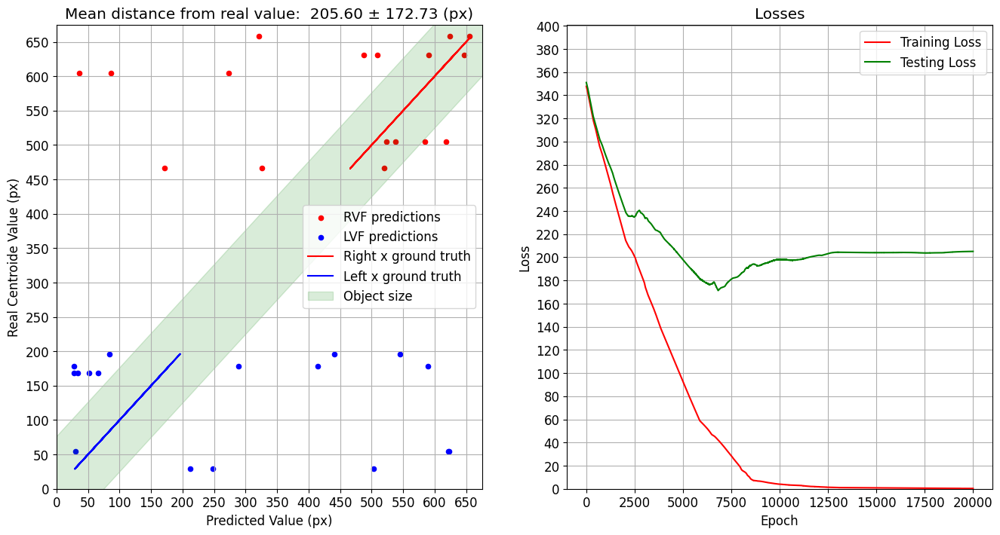

In [121]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize = (16,8))

x_losses = np.linspace(0, dl_epochs, dl_epochs)

plt.rcParams.update({'font.size': 12})

ax = axs[0]

x_preds = x_preds.reshape(len(x_preds),)

'''
Absolute error: |True value - Measured Value|
Relative error: |Absolute error / True value|
Percent  error: Relative error * 100
'''
rel_error = (np.abs(real_x - x_preds)/real_x)*100
distance = np.abs(real_x - x_preds)

RVF_real_x = [x for x in range(len(real_x)) if real_x[x] > IM_WIDTH/2]
LVF_real_x = [x for x in range(len(real_x)) if real_x[x] < IM_WIDTH/2]

# Scatter plots on the same axes
ax.scatter(x_preds[RVF_real_x], real_x[RVF_real_x], color='r', label='RVF predictions',alpha=1, s=20);
ax.scatter(x_preds[LVF_real_x], real_x[LVF_real_x], color='b', label='LVF predictions',alpha=1, s=20);

plus_minus_symbol = chr(0x00B1)
ax.set(xlabel='Predicted Value (px)', 
    xticks=np.arange(0, IM_WIDTH + 3, step = 50),
    xlim=(0, IM_WIDTH + 3),
    ylabel='Real Centroide Value (px)',
    yticks=np.arange(0, IM_WIDTH + 3, step = 50),
    ylim=(0, IM_WIDTH + 3),
    title=(f"Mean distance from real value: {np.mean(distance): .2f} {plus_minus_symbol}{np.std(distance): .2f} (px)"));
ax.grid(True)

ax.plot(real_x[RVF_real_x], real_x[RVF_real_x], 'r', alpha=1, label = 'Right x ground truth') # Line plot
ax.plot(real_x[LVF_real_x], real_x[LVF_real_x], 'b', alpha=1, label = 'Left x ground truth') 

diag_rect = patches.Rectangle(
    (min(real_x) - 50, (min(real_x))-(obj_region/2)/math.cos(math.radians(45)) - 50), 
                                max(real_x) + 400, obj_region, 
                                linewidth=1, edgecolor='g', facecolor='g', alpha=0.15, angle=45, label = 'Object size')
ax.add_patch(diag_rect) # Patch plot

ax.legend()

ax = axs[1]

ax.plot(x_losses, training_losses, 'r', label = 'Training Loss')
ax.plot(x_losses, testing_losses, 'g', label = 'Testing Loss')
ax.set(xlabel='Epoch',
        ylabel='Loss',
        yticks=np.arange(0, 401, step = 20),
        ylim=(0,401),
        title=(f"Losses"));
ax.legend(loc='upper right')
ax.grid(True)
    
plt.subplots_adjust(hspace=0.15)

## Training model (All features)

In [122]:
# Number of features

train_featVect = np.vstack((NN_featVectRVF[:n_train], NN_featVectLVF[:n_train]))
test_featVect = np.vstack((NN_featVectRVF[n_train:], NN_featVectLVF[n_train:]))

NUM_FEATURES = np.size(train_featVect,1) - 1

# Fit the model
torch.manual_seed(42)

# Set number of epochs
dl_epochs = 20000
    
# Initializing model

x_pos_model3 = N2pcModel(input_features=NUM_FEATURES, 
                output_features=1, 
                hidden_units=16).to(device)

loss_fn = nn.SmoothL1Loss()
optimizer = torch.optim.Adamax(x_pos_model3.parameters(), 
                        lr=0.005) 

# Shuffle

np.random.seed(42)
np.random.shuffle(train_featVect)
np.random.seed(42)
np.random.shuffle(test_featVect)

# Tensor convertion
tn_train_feat = torch.tensor(np.array(train_featVect[:,0:-1])).type(torch.float32)
tn_train_lbl = torch.tensor(np.array(train_featVect[:,-1])).type(torch.float32)

tn_test_feat = torch.tensor(np.array(test_featVect[:,0:-1])).type(torch.float32)
tn_test_lbl = torch.tensor(np.array(test_featVect[:,-1])).type(torch.float32)

# Feature wise normalization of feature vector
n_entries, n_feat = tn_train_feat.size()

for j in range(n_entries):

    mean = tn_train_feat[j,:].mean(dim=0)
    std = tn_train_feat[j,:].std(dim=0)
    tn_train_feat[j,:] = (tn_train_feat[j,:] - mean) / std

n_entries, n_feat = tn_test_feat.size()

for u in range(n_entries):

    mean = tn_test_feat[u,:].mean(dim=0)
    std = tn_test_feat[u,:].std(dim=0)
    tn_test_feat[u,:] = (tn_test_feat[u,:] - mean) / std

training_losses = []
testing_losses = []

for dl_epoch in range(dl_epochs):
    ### Training
    x_pos_model3.train()

    # 1. Forward pass
    x_pos_ = x_pos_model3(tn_train_feat)

    # 2. Calculate loss
    train_loss = loss_fn(torch.squeeze(x_pos_), tn_train_lbl) 
    training_losses.append(train_loss.detach().numpy())
  
    # 3. Optimizer zero grad
    optimizer.zero_grad()

    # 4. Loss backwards
    train_loss.backward()

    # 5. Optimizer step
    optimizer.step()

    ### Testing
    x_pos_model3.eval()
    with torch.inference_mode():
      # 1. Forward pass
      output = x_pos_model3(tn_test_feat)
      # 2. Calculate test loss and accuracy
      test_loss = loss_fn(torch.squeeze(output), tn_test_lbl)
      testing_losses.append(test_loss.detach().numpy())

    # Print out what's happening
    if (dl_epoch + 1) % 2000 == 0:
        print(f"Epoch: {dl_epoch + 1} | Training Loss: {train_loss:.5f}, | Testing Loss: {test_loss:.5f}")  

# ------------------------------------ Test ------------------------------------

# 1. Set the model in evaluation mode

x_pos_model3.eval()

# 2. Setup the inference mode context manager
with torch.inference_mode():
  x_preds = x_pos_model3(tn_test_feat)
  
x_preds = x_preds.numpy()
real_x = tn_test_lbl.numpy()

Epoch: 2000 | Training Loss: 212.60925, | Testing Loss: 227.95789
Epoch: 4000 | Training Loss: 135.69081, | Testing Loss: 187.35803
Epoch: 6000 | Training Loss: 62.91024, | Testing Loss: 128.80026
Epoch: 8000 | Training Loss: 31.56048, | Testing Loss: 108.77228
Epoch: 10000 | Training Loss: 6.22116, | Testing Loss: 103.56796
Epoch: 12000 | Training Loss: 2.97357, | Testing Loss: 107.90131
Epoch: 14000 | Training Loss: 0.72181, | Testing Loss: 105.82817
Epoch: 16000 | Training Loss: 0.29053, | Testing Loss: 107.44810
Epoch: 18000 | Training Loss: 0.04146, | Testing Loss: 108.98933
Epoch: 20000 | Training Loss: 0.04891, | Testing Loss: 109.38173


## Ploting predictions against the real values of the object's position alongisde the x-axis (All features)

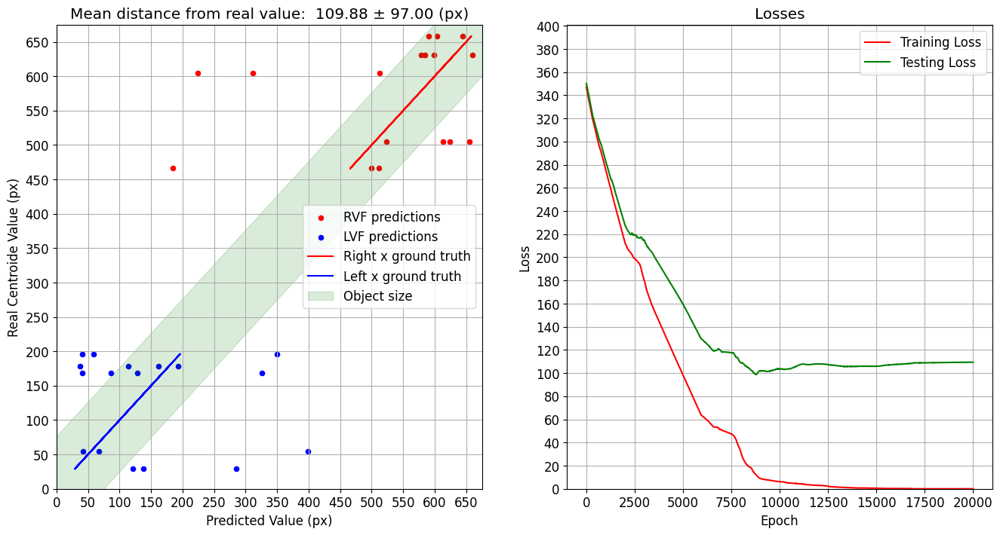

In [123]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize = (16,8))

x_losses = np.linspace(0, dl_epochs, dl_epochs)

plt.rcParams.update({'font.size': 12})

ax = axs[0]

x_preds = x_preds.reshape(len(x_preds),)

'''
Absolute error: |True value - Measured Value|
Relative error: |Absolute error / True value|
Percent  error: Relative error * 100
'''
rel_error = (np.abs(real_x - x_preds)/real_x)*100
distance = np.abs(real_x - x_preds)

RVF_real_x = [x for x in range(len(real_x)) if real_x[x] > IM_WIDTH/2]
LVF_real_x = [x for x in range(len(real_x)) if real_x[x] < IM_WIDTH/2]

# Scatter plots on the same axes
ax.scatter(x_preds[RVF_real_x], real_x[RVF_real_x], color='r', label='RVF predictions',alpha=1, s=20);
ax.scatter(x_preds[LVF_real_x], real_x[LVF_real_x], color='b', label='LVF predictions',alpha=1, s=20);

plus_minus_symbol = chr(0x00B1)
ax.set(xlabel='Predicted Value (px)', 
    xticks=np.arange(0, IM_WIDTH + 3, step = 50),
    xlim=(0, IM_WIDTH + 3),
    ylabel='Real Centroide Value (px)',
    yticks=np.arange(0, IM_WIDTH + 3, step = 50),
    ylim=(0, IM_WIDTH + 3),
    title=(f"Mean distance from real value: {np.mean(distance): .2f} {plus_minus_symbol}{np.std(distance): .2f} (px)"));
ax.grid(True)

ax.plot(real_x[RVF_real_x], real_x[RVF_real_x], 'r', alpha=1, label = 'Right x ground truth') # Line plot
ax.plot(real_x[LVF_real_x], real_x[LVF_real_x], 'b', alpha=1, label = 'Left x ground truth') 

diag_rect = patches.Rectangle(
    (min(real_x) - 50, (min(real_x))-(obj_region/2)/math.cos(math.radians(45)) - 50), 
                                max(real_x) + 400, obj_region, 
                                linewidth=1, edgecolor='g', facecolor='g', alpha=0.15, angle=45, label = 'Object size')
ax.add_patch(diag_rect) # Patch plot

ax.legend()

ax = axs[1]

ax.plot(x_losses, training_losses, 'r', label = 'Training Loss')
ax.plot(x_losses, testing_losses, 'g', label = 'Testing Loss')
ax.set(xlabel='Epoch',
        ylabel='Loss',
        yticks=np.arange(0, 401, step = 20),
        ylim=(0,401),
        title=(f"Losses"));
ax.legend(loc='upper right')
ax.grid(True)
    
plt.subplots_adjust(hspace=0.15)

# **Averaging Midline Bilateral - Lateralized Ipsilateral component: N2pcb (200 - 400 ms)**

The mean amplitude of the N2pcb elicited by midline targets was computed as
the subtraction of the ipsilateral activity elicited by lateralized targets from the averaged bilateral activity elicited by
a midline target.

## Grand-Average

In [124]:
VERTICAL_CONDITION_COL = 6
VERTICAL_VA_COL = 4
Y_CENTROID_COL = 2

TVF = []
BVF = []

TVF_y_pos = []
BVF_y_pos = []

for trial in labelled_targets:
    if trial[VERTICAL_CONDITION_COL] == "TVF":
        TVF.append( (trial[DATA_COL][right_N2pc_ch_idx,:] + trial[DATA_COL][left_N2pc_ch_idx,:])/2 - aver_ipsi)
        TVF_y_pos.append(trial[Y_CENTROID_COL])
    elif trial[VERTICAL_CONDITION_COL] == "BVF":
        BVF.append( (trial[DATA_COL][right_N2pc_ch_idx,:] + trial[DATA_COL][left_N2pc_ch_idx,:])/2 - aver_ipsi)
        BVF_y_pos.append(trial[Y_CENTROID_COL])

aver_TVF = np.mean(TVF, axis = 0)
aver_BVF = np.mean(BVF, axis = 0)

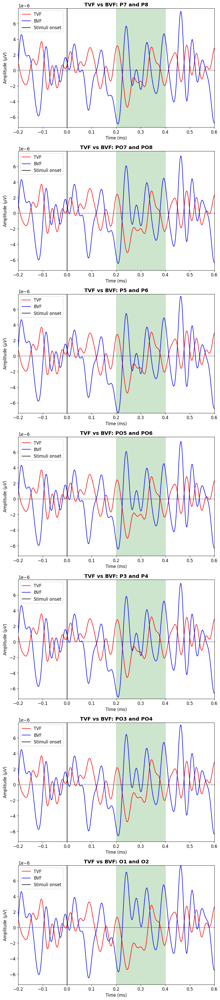

In [125]:
fig, ax = plt.subplots(figsize=(10, 50), nrows=7, ncols=1)

for i in range(len(left_N2pc_ch_idx)):
    ax[pos[i][0]].plot(ERP_times, aver_TVF[i],'r', label = 'TVF')
    ax[pos[i][0]].plot(ERP_times, aver_BVF[i],'b', label = 'BVF')
    ax[pos[i][0]].axvline(x=0, color='k', label = 'Stimuli onset')
    ax[pos[i][0]].axhline(y=0, color='k', linestyle='dotted')
    ax[pos[i][0]].set_xlim([np.min(ERP_times),np.max(ERP_times)])
    ax[pos[i][0]].set_ylim([np.min(aver_BVF),np.max(aver_BVF)])

    N2pc_region = patches.Rectangle((0.2, -0.1), 0.2, 0.2, linewidth=1, edgecolor='g', facecolor='g', alpha=0.2)
    # - `(200, -1)` is the bottom-left corner of the rectangle (x, y coordinates). Note the y values in the graph are in microVolts
    # - `200` is the width of the rectangle.
    # - `2` is the height of the rectangle.

    ax[pos[i][0]].add_patch(N2pc_region)

    ax[pos[i][0]].set_title(f"TVF vs BVF: {clean_ch[left_N2pc_ch_idx[i]]} and {clean_ch[right_N2pc_ch_idx[i]]}", fontweight = 'bold')
    ax[pos[i][0],].set_xlabel('Time (ms)')
    ax[pos[i][0]].set_ylabel('Amplitude ($\mu V$)')
    ax[pos[i][0]].legend(loc='upper left')

## Calculate the single-trial N2pcb component

In [126]:
n_trials,  _, _ = np.shape(TVF)

featVectTVF = []
featVectBVF = []

NN_featVectTVF = []
NN_featVectBVF = []

ts = 0.2
te = 0.4

idx_s = np.argmin(np.abs(ERP_times - ts))
idx_e = np.argmin(np.abs(ERP_times - te))

# Resampling the resulting time window (Prevents overfitting)

RESAMPLE_FREQ = 64 # Hz
N_DATAPOINTS_ORIG_FREQ = len(ERP_times[idx_s:idx_e+1])
N_DATAPOINTS_RESA_FREQ = int(np.ceil((N_DATAPOINTS_ORIG_FREQ * RESAMPLE_FREQ)/fs))

idx_s = np.argmin(np.abs(ERP_times - ts))
idx_e = np.argmin(np.abs(ERP_times - te))

for trial in range(n_trials):

    res_TVF = resample(TVF[trial][:,idx_s:idx_e+1], N_DATAPOINTS_RESA_FREQ, axis = -1)
    res_BVF = resample(BVF[trial][:,idx_s:idx_e+1], N_DATAPOINTS_RESA_FREQ, axis = -1)
    
    for c in range(1, n_channels):

        if (c == 1):
            auxTVF = np.hstack((res_TVF[c-1,:],res_TVF[c,:]))
            auxBVF = np.hstack((res_BVF[c-1,:],res_BVF[c,:]))
        else:
            auxTVF = np.hstack((auxTVF,res_TVF[c,:]))
            auxBVF = np.hstack((auxBVF,res_BVF[c,:]))
    
    '''
    if(trial >= 0 and trial <= 30):
        plt.plot(res_TVF[0], "b:", label = "TVF")
        plt.plot(res_BVF[0], "r", label = "BVF")
        plt.legend()
        plt.show()
    '''

    featVectTVF.append(np.hstack((auxTVF, 0)))
    featVectBVF.append(np.hstack((auxBVF, 1)))

    NN_featVectTVF.append(np.hstack((auxTVF, TVF_y_pos[trial])))
    NN_featVectBVF.append(np.hstack((auxBVF, BVF_y_pos[trial])))

print(np.shape(featVectTVF))
print(np.shape(featVectBVF))

(98, 92)
(98, 92)


# **Classifying N2pcb: TVF vs BVF**

## Train/Test Split and concatenate feature vectors for all channel differences

In [127]:
n_train = int(np.ceil(n_trials * PERCENT_TRAIN))

train_featVect = np.vstack((featVectTVF[:n_train], featVectBVF[:n_train]))
test_featVect = np.vstack((featVectTVF[n_train:], featVectBVF[n_train:]))

random.seed(42)
np.random.shuffle(train_featVect)
random.seed(42)
np.random.shuffle(test_featVect)

# Mutual Based Information

In [128]:
best_feat_idx = SelectKBest(mutual_info_classif, k = k_feat).fit(train_featVect[:,0:-1], train_featVect[:,-1]).get_support()
best_feat_idx = np.append(best_feat_idx, False)

### Selecting the most relevant channel for classification

In [129]:
tf = np.zeros(n_ch)
cont = np.ones(N_DATAPOINTS_RESA_FREQ)

for i in range(n_ch):
    tf[i] = (np.sum(cont[best_feat_idx[i*N_DATAPOINTS_RESA_FREQ:i*N_DATAPOINTS_RESA_FREQ+N_DATAPOINTS_RESA_FREQ]]))

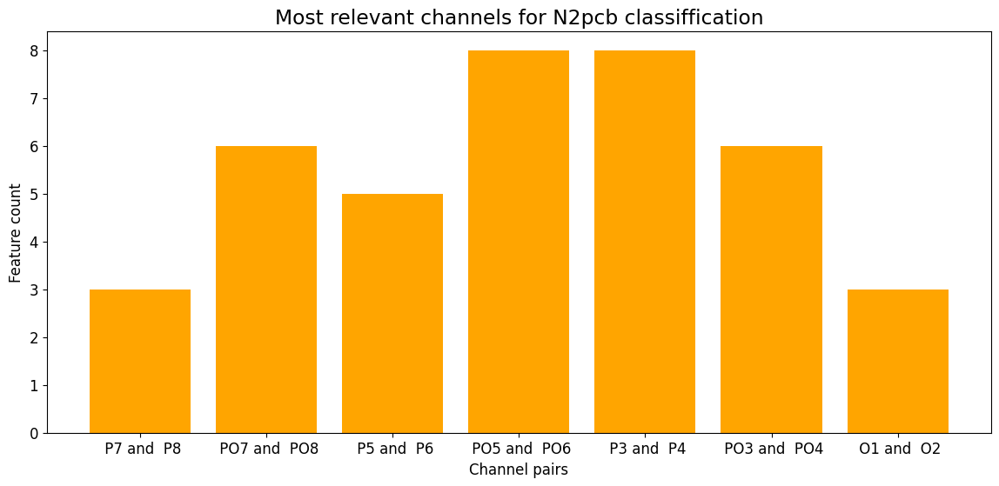

In [130]:
customlb = []
for c, lb in enumerate(left_N2pc_channels):
    customlb.append(str(lb) + " and " + str(right_N2pc_channels[c]))

fig, ax = plt.subplots(figsize=(14, 6))
plt.rcParams.update({'font.size': 14})
ax.set_title(f'Most relevant channels for N2pcb classiffication')
ax.bar(np.arange(1, n_ch + 1), tf, color="orange", capsize=4)
ax.set(xticks=np.arange(1, n_ch + 1), 
       xlabel='Channel pairs', 
       yticks=np.arange(0, max(tf) + 1, step=1),
       ylabel = "Feature count")
ax.set_xticklabels(customlb);

### Selecting the most relevant channel for classification

In [131]:
best_channel_feat_idx = np.zeros(len(best_feat_idx))

for i in range(len(tf)):
    if(tf[i] >=  sorted(tf, reverse = True)[2]):
        best_channel_feat_idx[i * N_DATAPOINTS_RESA_FREQ:i * N_DATAPOINTS_RESA_FREQ + N_DATAPOINTS_RESA_FREQ] = 1
    else:
        best_channel_feat_idx[i * N_DATAPOINTS_RESA_FREQ: i * N_DATAPOINTS_RESA_FREQ + N_DATAPOINTS_RESA_FREQ] = 0

best_channel_feat_idx = best_channel_feat_idx != 0 # Convert to boolean
best_channel_feat_idx

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False])

## Classification models

### Most discriminative channels

In [132]:
print("Most discriminative channels\n")

# SVM
kernel = 'sigmoid'
clf16 = SVC(kernel=kernel, probability=True)
scores = cross_val_score(clf16, train_featVect[:, best_channel_feat_idx], train_featVect[:, -1], cv=kfold)
clf16.fit(train_featVect[:, best_channel_feat_idx], train_featVect[:, -1])
pred = clf16.predict(test_featVect[:, best_channel_feat_idx])
print("------------- SVM -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf16.predict_proba(test_featVect[:,best_channel_feat_idx])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# LDA
clf17 = LDA()
scores = cross_val_score(clf17, train_featVect[:, best_channel_feat_idx], train_featVect[:, -1], cv=kfold)
clf17.fit(train_featVect[:, best_channel_feat_idx], train_featVect[:, -1])
pred = clf17.predict(test_featVect[:, best_channel_feat_idx])
print("\n------------- LDA -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf17.predict_proba(test_featVect[:, best_channel_feat_idx])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# Random Forest
clf18 = RandomForestClassifier()  # Create an instance of Random Forest classifier
scores = cross_val_score(clf18, train_featVect[:, best_channel_feat_idx], train_featVect[:, -1], cv=kfold)
clf18.fit(train_featVect[:, best_channel_feat_idx], train_featVect[:, -1])
pred = clf18.predict(test_featVect[:, best_channel_feat_idx])
print("\n------------- Random Forest -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf18.predict_proba(test_featVect[:, best_channel_feat_idx])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# XGBoost
clf19 = xgb.XGBClassifier()  # Create an instance of XGBoost classifier
scores = cross_val_score(clf19, train_featVect[:, best_channel_feat_idx], train_featVect[:, -1], cv=kfold)
clf19.fit(train_featVect[:, best_channel_feat_idx], train_featVect[:, -1])
pred = clf19.predict(test_featVect[:, best_channel_feat_idx])
print("\n------------- XGBoost -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf19.predict_proba(test_featVect[:,best_channel_feat_idx])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# Adaboost
clf20 = AdaBoostClassifier()  # Create an instance of AdaBoost classifier
scores = cross_val_score(clf20, train_featVect[:, best_channel_feat_idx], train_featVect[:, -1], cv=kfold)
clf20.fit(train_featVect[:, best_channel_feat_idx], train_featVect[:, -1])
pred = clf20.predict(test_featVect[:, best_channel_feat_idx])
print("\n------------- AdaBoost -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf20.predict_proba(test_featVect[:, best_channel_feat_idx])[:,1]),2)) # [:,1] is related to the column of probability predictions of the second class (1). [:,0] would be the first (0)
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

Most discriminative channels

------------- SVM -------------
AUC:  0.55
Cross validation mean score: 0.58 +/- 0.11
Accuracy:  0.62

------------- LDA -------------
AUC:  0.68
Cross validation mean score: 0.52 +/- 0.12
Accuracy:  0.6

------------- Random Forest -------------
AUC:  0.6
Cross validation mean score: 0.48 +/- 0.12
Accuracy:  0.62

------------- XGBoost -------------
AUC:  0.6
Cross validation mean score: 0.47 +/- 0.16
Accuracy:  0.56

------------- AdaBoost -------------
AUC:  0.61
Cross validation mean score: 0.5 +/- 0.16
Accuracy:  0.62


### Most discriminative features

In [133]:
print("Most discriminative features\n")

# SVM
kernel = 'sigmoid'
clf21 = SVC(kernel=kernel, probability=True)
scores = cross_val_score(clf21, train_featVect[:, best_feat_idx], train_featVect[:, -1], cv=kfold)
clf21.fit(train_featVect[:, best_feat_idx], train_featVect[:, -1])
pred = clf21.predict(test_featVect[:, best_feat_idx])
print("------------- SVM -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf21.predict_proba(test_featVect[:,best_feat_idx])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# LDA
clf22 = LDA()
scores = cross_val_score(clf22, train_featVect[:, best_feat_idx], train_featVect[:, -1], cv=kfold)
clf22.fit(train_featVect[:, best_feat_idx], train_featVect[:, -1])
pred = clf22.predict(test_featVect[:, best_feat_idx])
print("\n------------- LDA -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf22.predict_proba(test_featVect[:, best_feat_idx])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# Random Forest
clf23 = RandomForestClassifier()  # Create an instance of Random Forest classifier
scores = cross_val_score(clf23, train_featVect[:, best_feat_idx], train_featVect[:, -1], cv=kfold)
clf23.fit(train_featVect[:, best_feat_idx], train_featVect[:, -1])
pred = clf23.predict(test_featVect[:, best_feat_idx])
print("\n------------- Random Forest -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf23.predict_proba(test_featVect[:, best_feat_idx])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# XGBoost
clf24 = xgb.XGBClassifier()  # Create an instance of XGBoost classifier
scores = cross_val_score(clf24, train_featVect[:, best_feat_idx], train_featVect[:, -1], cv=kfold)
clf24.fit(train_featVect[:, best_feat_idx], train_featVect[:, -1])
pred = clf24.predict(test_featVect[:, best_feat_idx])
print("\n------------- XGBoost -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf24.predict_proba(test_featVect[:, best_feat_idx])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# Adaboost
clf25 = AdaBoostClassifier()  # Create an instance of AdaBoost classifier
scores = cross_val_score(clf25, train_featVect[:, best_feat_idx], train_featVect[:, -1], cv=kfold)
clf25.fit(train_featVect[:, best_feat_idx], train_featVect[:, -1])
pred = clf25.predict(test_featVect[:, best_feat_idx])
print("\n------------- AdaBoost -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf25.predict_proba(test_featVect[:, best_feat_idx])[:,1]),2)) # [:,1] is related to the column of probability predictions of the second class (1). [:,0] would be the first (0)
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

Most discriminative features

------------- SVM -------------
AUC:  0.57
Cross validation mean score: 0.54 +/- 0.17
Accuracy:  0.6

------------- LDA -------------
AUC:  0.72
Cross validation mean score: 0.6 +/- 0.11
Accuracy:  0.71

------------- Random Forest -------------
AUC:  0.66
Cross validation mean score: 0.52 +/- 0.15
Accuracy:  0.6

------------- XGBoost -------------
AUC:  0.58
Cross validation mean score: 0.49 +/- 0.15
Accuracy:  0.6

------------- AdaBoost -------------
AUC:  0.63
Cross validation mean score: 0.48 +/- 0.16
Accuracy:  0.56


### All features

In [134]:
print("All features\n")

# SVM
kernel = 'sigmoid'
clf26 = SVC(kernel=kernel, probability=True)
scores = cross_val_score(clf26, train_featVect[:, 0:-1], train_featVect[:, -1], cv=kfold)
clf26.fit(train_featVect[:, 0:-1], train_featVect[:, -1])
pred = clf26.predict(test_featVect[:, 0:-1])
print("------------- SVM -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf26.predict_proba(test_featVect[:, 0:-1])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# LDA
clf27 = LDA()
scores = cross_val_score(clf27, train_featVect[:, 0:-1], train_featVect[:, -1], cv=kfold)
clf27.fit(train_featVect[:, 0:-1], train_featVect[:, -1])
pred = clf27.predict(test_featVect[:, 0:-1])
print("\n------------- LDA -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf27.predict_proba(test_featVect[:, 0:-1])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# Random Forest
clf28 = RandomForestClassifier()  # Create an instance of Random Forest classifier
scores = cross_val_score(clf28, train_featVect[:, 0:-1], train_featVect[:, -1], cv=kfold)
clf28.fit(train_featVect[:, 0:-1], train_featVect[:, -1])
pred = clf28.predict(test_featVect[:, 0:-1])
print("\n------------- Random Forest -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf28.predict_proba(test_featVect[:, 0:-1])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# XGBoost
clf29 = xgb.XGBClassifier()  # Create an instance of XGBoost classifier
scores = cross_val_score(clf29, train_featVect[:, 0:-1], train_featVect[:, -1], cv=kfold)
clf29.fit(train_featVect[:, 0:-1], train_featVect[:, -1])
pred = clf29.predict(test_featVect[:, 0:-1])
print("\n------------- XGBoost -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf29.predict_proba(test_featVect[:, 0:-1])[:,1]),2))
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

# Adaboost
clf30 = AdaBoostClassifier()  # Create an instance of AdaBoost classifier
scores = cross_val_score(clf30, train_featVect[:, 0:-1], train_featVect[:, -1], cv=kfold)
clf30.fit(train_featVect[:, 0:-1], train_featVect[:, -1])
pred = clf30.predict(test_featVect[:, 0:-1])
print("\n------------- AdaBoost -------------")
print("AUC: ", round(roc_auc_score(test_featVect[:, -1], clf30.predict_proba(test_featVect[:, 0:-1])[:,1]),2)) # [:,1] is related to the column of probability predictions of the second class (1). [:,0] would be the first (0)
print(f"Cross validation mean score: {round(scores.mean(),2)} +/- {round(scores.std(),2)}")
print("Accuracy: ", round(accuracy_score(test_featVect[:,-1], pred),2))

All features

------------- SVM -------------
AUC:  0.57
Cross validation mean score: 0.58 +/- 0.11
Accuracy:  0.67

------------- LDA -------------
AUC:  0.65
Cross validation mean score: 0.56 +/- 0.14
Accuracy:  0.6

------------- Random Forest -------------
AUC:  0.67
Cross validation mean score: 0.47 +/- 0.13
Accuracy:  0.62

------------- XGBoost -------------
AUC:  0.61
Cross validation mean score: 0.47 +/- 0.18
Accuracy:  0.6

------------- AdaBoost -------------
AUC:  0.6
Cross validation mean score: 0.55 +/- 0.15
Accuracy:  0.54


## NN model

In [135]:
torch.manual_seed(42)

class N2pcbModel(nn.Module):
    def __init__(self, input_features, output_features, hidden_units=8):
        """Initializes all required hyperparameters for a multi-class classification model.

        Args:
            input_features (int): Number of input features to the model.
            out_features (int): Number of output features of the model
              (how many classes there are).
            hidden_units (int): Number of hidden units between layers, default 8.
        """
        super().__init__()
        self.linear_layer_stack = nn.Sequential(
            nn.Linear(in_features=input_features, out_features=hidden_units),
            nn.Sigmoid(), 
            nn.Linear(in_features=hidden_units, out_features=hidden_units),
            nn.Sigmoid(), 
            nn.Linear(in_features=hidden_units, out_features=output_features),
        )
    
    def forward(self, x):
        return self.linear_layer_stack(x)

## Training model (Most discriminative channels)

In [136]:
# Number of features

train_featVect = np.vstack((NN_featVectTVF[:n_train], NN_featVectBVF[:n_train]))
test_featVect = np.vstack((NN_featVectTVF[n_train:], NN_featVectBVF[n_train:]))

NUM_FEATURES = np.size(train_featVect[:, best_channel_feat_idx],1)

# Fit the model
torch.manual_seed(42)

# Set number of epochs
dl_epochs = 20000
    
# Initializing model

y_pos_model1 = N2pcbModel(input_features=NUM_FEATURES, 
                output_features=1, 
                hidden_units=16).to(device)

loss_fn = nn.SmoothL1Loss()
optimizer = torch.optim.Adamax(y_pos_model1.parameters(), 
                        lr=0.005) 

# Shuffle

np.random.seed(42)
np.random.shuffle(train_featVect)
np.random.seed(42)
np.random.shuffle(test_featVect)

# Tensor convertion
tn_train_feat = torch.tensor(np.array(train_featVect[:, best_channel_feat_idx])).type(torch.float32)
tn_train_lbl = torch.tensor(np.array(train_featVect[:,-1])).type(torch.float32)

tn_test_feat = torch.tensor(np.array(test_featVect[:, best_channel_feat_idx])).type(torch.float32)
tn_test_lbl = torch.tensor(np.array(test_featVect[:,-1])).type(torch.float32)

# Feature wise normalization of feature vector
n_entries, n_feat = tn_train_feat.size()

for j in range(n_entries):

    mean = tn_train_feat[j,:].mean(dim=0)
    std = tn_train_feat[j,:].std(dim=0)
    tn_train_feat[j,:] = (tn_train_feat[j,:] - mean) / std

n_entries, n_feat = tn_test_feat.size()

for u in range(n_entries):

    mean = tn_test_feat[u,:].mean(dim=0)
    std = tn_test_feat[u,:].std(dim=0)
    tn_test_feat[u,:] = (tn_test_feat[u,:] - mean) / std

training_losses = []
testing_losses = []

for dl_epoch in range(dl_epochs):
    ### Training
    y_pos_model1.train()

    # 1. Forward pass
    y_pos_ = y_pos_model1(tn_train_feat)

    # 2. Calculate loss
    train_loss = loss_fn(torch.squeeze(y_pos_), tn_train_lbl) 
    training_losses.append(train_loss.detach().numpy())
  
    # 3. Optimizer zero grad
    optimizer.zero_grad()

    # 4. Loss backwards
    train_loss.backward()

    # 5. Optimizer step
    optimizer.step()

    ### Testing
    y_pos_model1.eval()
    with torch.inference_mode():
      # 1. Forward pass
      output = y_pos_model1(tn_test_feat)
      # 2. Calculate test loss and accuracy
      test_loss = loss_fn(torch.squeeze(output), tn_test_lbl)
      testing_losses.append(test_loss.detach().numpy())

    # Print out what's happening
    if (dl_epoch + 1) % 2000 == 0:
        print(f"Epoch: {dl_epoch + 1} | Training Loss: {train_loss:.5f}, | Testing Loss: {test_loss:.5f}")  

# ------------------------------------ Test ------------------------------------

# 1. Set the model in evaluation mode

y_pos_model1.eval()

# 2. Setup the inference mode context manager
with torch.inference_mode():
  y_preds = y_pos_model1(tn_test_feat)
  
y_preds = y_preds.numpy()
real_y = tn_test_lbl.numpy()

Epoch: 2000 | Training Loss: 149.33366, | Testing Loss: 174.02882
Epoch: 4000 | Training Loss: 65.70909, | Testing Loss: 165.24310
Epoch: 6000 | Training Loss: 27.64424, | Testing Loss: 181.96315
Epoch: 8000 | Training Loss: 14.17780, | Testing Loss: 186.80664
Epoch: 10000 | Training Loss: 10.62032, | Testing Loss: 186.76894
Epoch: 12000 | Training Loss: 8.44467, | Testing Loss: 181.29756
Epoch: 14000 | Training Loss: 7.87224, | Testing Loss: 181.50653
Epoch: 16000 | Training Loss: 7.42153, | Testing Loss: 176.74022
Epoch: 18000 | Training Loss: 6.89503, | Testing Loss: 171.70039
Epoch: 20000 | Training Loss: 6.71967, | Testing Loss: 169.09389


## Ploting predictions against the real values of the object's position alongisde the y-axis (Most discriminative channels)

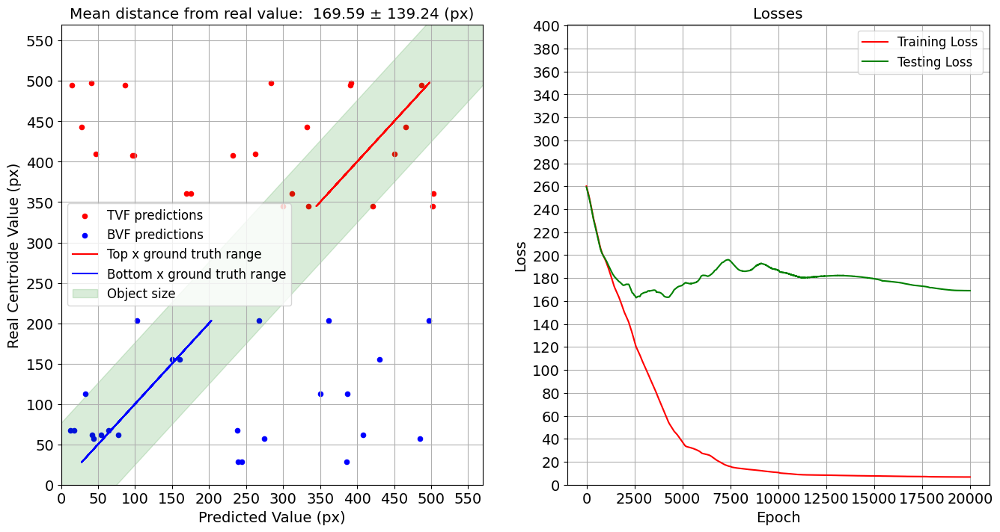

In [137]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize = (16,8))

y_losses = np.linspace(0, dl_epochs, dl_epochs)

plt.rcParams.update({'font.size': 12})

ax = axs[0]

y_preds = y_preds.reshape(len(y_preds),)

'''
Absolute error: |True value - Measured Value|
Relative error: |Absolute error / True value|
Percent  error: Relative error * 100
'''
rel_error = (np.abs(real_y - y_preds)/real_y)*100
distance = np.abs(real_y - y_preds)

TVF_real_y = [y for y in range(len(real_y)) if real_y[y] > IM_HEIGHT/2]
BVF_real_y = [y for y in range(len(real_y)) if real_y[y] < IM_HEIGHT/2]

# Scatter plots on the same axes
ax.scatter(y_preds[TVF_real_y], real_y[TVF_real_y], color='r', label='TVF predictions',alpha=1, s=20);
ax.scatter(y_preds[BVF_real_y], real_y[BVF_real_y], color='b', label='BVF predictions',alpha=1, s=20);

plus_minus_symbol = chr(0x00B1)
ax.set(xlabel='Predicted Value (px)', 
    xticks=np.arange(0, IM_HEIGHT + 3, step = 50),
    xlim=(0, IM_HEIGHT + 3),
    ylabel='Real Centroide Value (px)',
    yticks=np.arange(0, IM_HEIGHT + 3, step = 50),
    ylim=(0, IM_HEIGHT + 3),
    title=(f"Mean distance from real value: {np.mean(distance): .2f} {plus_minus_symbol}{np.std(distance): .2f} (px)"));
ax.grid(True)

ax.plot(real_y[TVF_real_y], real_y[TVF_real_y], 'r', alpha=1, label = 'Top x ground truth range') # Line plot
ax.plot(real_y[BVF_real_y], real_y[BVF_real_y], 'b', alpha=1, label = 'Bottom x ground truth range') 

diag_rect = patches.Rectangle(
    (min(real_y) - 50, (min(real_y))-(obj_region/2)/math.cos(math.radians(45)) - 50), 
                                max(real_y) + 400, obj_region, 
                                linewidth=1, edgecolor='g', facecolor='g', alpha=0.15, angle=45, label = 'Object size')
ax.add_patch(diag_rect) # Patch plot

ax.legend()

ax = axs[1]

ax.plot(y_losses, training_losses, 'r', label = 'Training Loss')
ax.plot(y_losses, testing_losses, 'g', label = 'Testing Loss')
ax.set(xlabel='Epoch',
        ylabel='Loss',
        yticks=np.arange(0, 401, step = 20),
        ylim=(0,401),
        title=(f"Losses"));
ax.legend(loc='upper right')
ax.grid(True)
    
plt.subplots_adjust(hspace=0.15)

## Training model (Most discriminative features)

In [138]:
# Number of features

train_featVect = np.vstack((NN_featVectTVF[:n_train], NN_featVectBVF[:n_train]))
test_featVect = np.vstack((NN_featVectTVF[n_train:], NN_featVectBVF[n_train:]))

NUM_FEATURES = np.size(train_featVect[:, best_feat_idx],1)

# Fit the model
torch.manual_seed(42)

# Set number of epochs
dl_epochs = 20000
    
# Initializing model

y_pos_model2 = N2pcbModel(input_features=NUM_FEATURES, 
                output_features=1, 
                hidden_units=16).to(device)

loss_fn = nn.SmoothL1Loss()
optimizer = torch.optim.Adamax(y_pos_model2.parameters(), 
                        lr=0.005) 

# Shuffle

np.random.seed(42)
np.random.shuffle(train_featVect)
np.random.seed(42)
np.random.shuffle(test_featVect)

# Tensor convertion
tn_train_feat = torch.tensor(np.array(train_featVect[:, best_feat_idx])).type(torch.float32)
tn_train_lbl = torch.tensor(np.array(train_featVect[:,-1])).type(torch.float32)

tn_test_feat = torch.tensor(np.array(test_featVect[:, best_feat_idx])).type(torch.float32)
tn_test_lbl = torch.tensor(np.array(test_featVect[:,-1])).type(torch.float32)

# Feature wise normalization of feature vector
n_entries, n_feat = tn_train_feat.size()

for j in range(n_entries):

    mean = tn_train_feat[j,:].mean(dim=0)
    std = tn_train_feat[j,:].std(dim=0)
    tn_train_feat[j,:] = (tn_train_feat[j,:] - mean) / std

n_entries, n_feat = tn_test_feat.size()

for u in range(n_entries):

    mean = tn_test_feat[u,:].mean(dim=0)
    std = tn_test_feat[u,:].std(dim=0)
    tn_test_feat[u,:] = (tn_test_feat[u,:] - mean) / std

training_losses = []
testing_losses = []

for dl_epoch in range(dl_epochs):
    ### Training
    y_pos_model2.train()

    # 1. Forward pass
    y_pos_ = y_pos_model2(tn_train_feat)

    # 2. Calculate loss
    train_loss = loss_fn(torch.squeeze(y_pos_), tn_train_lbl) 
    training_losses.append(train_loss.detach().numpy())
  
    # 3. Optimizer zero grad
    optimizer.zero_grad()

    # 4. Loss backwards
    train_loss.backward()

    # 5. Optimizer step
    optimizer.step()

    ### Testing
    y_pos_model2.eval()
    with torch.inference_mode():
      # 1. Forward pass
      output = y_pos_model2(tn_test_feat)
      # 2. Calculate test loss and accuracy
      test_loss = loss_fn(torch.squeeze(output), tn_test_lbl)
      testing_losses.append(test_loss.detach().numpy())

    # Print out what's happening
    if (dl_epoch + 1) % 2000 == 0:
        print(f"Epoch: {dl_epoch + 1} | Training Loss: {train_loss:.5f}, | Testing Loss: {test_loss:.5f}")  

# ------------------------------------ Test ------------------------------------

# 1. Set the model in evaluation mode

y_pos_model2.eval()

# 2. Setup the inference mode context manager
with torch.inference_mode():
  y_preds = y_pos_model2(tn_test_feat)
  
y_preds = y_preds.numpy()
real_y = tn_test_lbl.numpy()

Epoch: 2000 | Training Loss: 156.41504, | Testing Loss: 174.57043
Epoch: 4000 | Training Loss: 104.25513, | Testing Loss: 156.89708
Epoch: 6000 | Training Loss: 66.75124, | Testing Loss: 171.49895
Epoch: 8000 | Training Loss: 51.96454, | Testing Loss: 176.36461
Epoch: 10000 | Training Loss: 37.97627, | Testing Loss: 191.35402
Epoch: 12000 | Training Loss: 30.43678, | Testing Loss: 203.32808
Epoch: 14000 | Training Loss: 24.31834, | Testing Loss: 197.70892
Epoch: 16000 | Training Loss: 21.21734, | Testing Loss: 187.26945
Epoch: 18000 | Training Loss: 17.53920, | Testing Loss: 181.53532
Epoch: 20000 | Training Loss: 14.71337, | Testing Loss: 179.04089


## Ploting predictions against the real values of the object's position alongisde the y-axis (Most discriminative features)

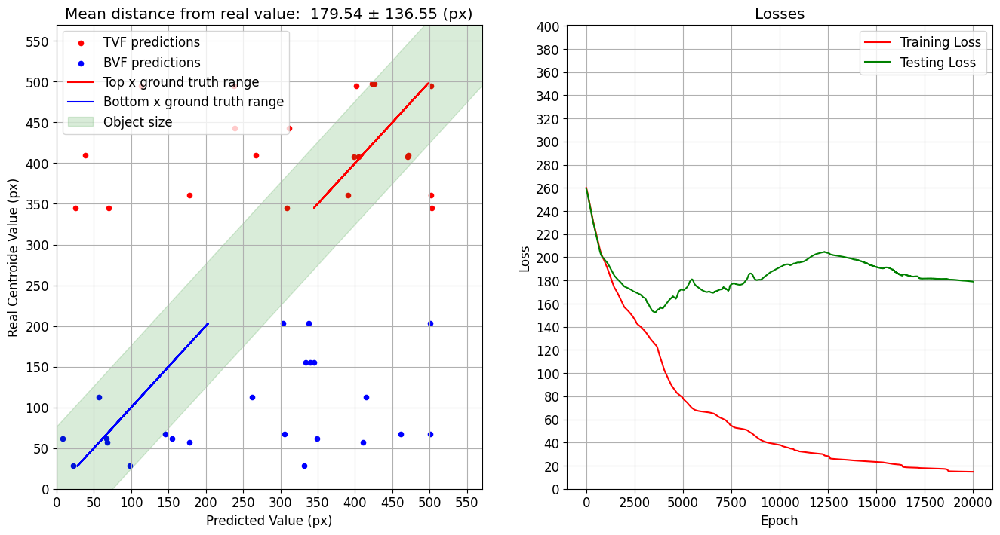

In [139]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize = (16,8))

y_losses = np.linspace(0, dl_epochs, dl_epochs)

plt.rcParams.update({'font.size': 12})

ax = axs[0]

y_preds = y_preds.reshape(len(y_preds),)

'''
Absolute error: |True value - Measured Value|
Relative error: |Absolute error / True value|
Percent  error: Relative error * 100
'''
rel_error = (np.abs(real_y - y_preds)/real_y)*100
distance = np.abs(real_y - y_preds)

TVF_real_y = [y for y in range(len(real_y)) if real_y[y] > IM_HEIGHT/2]
BVF_real_y = [y for y in range(len(real_y)) if real_y[y] < IM_HEIGHT/2]

# Scatter plots on the same axes
ax.scatter(y_preds[TVF_real_y], real_y[TVF_real_y], color='r', label='TVF predictions',alpha=1, s=20);
ax.scatter(y_preds[BVF_real_y], real_y[BVF_real_y], color='b', label='BVF predictions',alpha=1, s=20);

plus_minus_symbol = chr(0x00B1)
ax.set(xlabel='Predicted Value (px)', 
    xticks=np.arange(0, IM_HEIGHT + 3, step = 50),
    xlim=(0, IM_HEIGHT + 3),
    ylabel='Real Centroide Value (px)',
    yticks=np.arange(0, IM_HEIGHT + 3, step = 50),
    ylim=(0, IM_HEIGHT + 3),
    title=(f"Mean distance from real value: {np.mean(distance): .2f} {plus_minus_symbol}{np.std(distance): .2f} (px)"));
ax.grid(True)

ax.plot(real_y[TVF_real_y], real_y[TVF_real_y], 'r', alpha=1, label = 'Top x ground truth range') # Line plot
ax.plot(real_y[BVF_real_y], real_y[BVF_real_y], 'b', alpha=1, label = 'Bottom x ground truth range') 

diag_rect = patches.Rectangle(
    (min(real_y) - 50, (min(real_y))-(obj_region/2)/math.cos(math.radians(45)) - 50), 
                                max(real_y) + 400, obj_region, 
                                linewidth=1, edgecolor='g', facecolor='g', alpha=0.15, angle=45, label = 'Object size')
ax.add_patch(diag_rect) # Patch plot

ax.legend()

ax = axs[1]

ax.plot(y_losses, training_losses, 'r', label = 'Training Loss')
ax.plot(y_losses, testing_losses, 'g', label = 'Testing Loss')
ax.set(xlabel='Epoch',
        ylabel='Loss',
        yticks=np.arange(0, 401, step = 20),
        ylim=(0,401),
        title=(f"Losses"));
ax.legend(loc='upper right')
ax.grid(True)
    
plt.subplots_adjust(hspace=0.15)

## Training model (All features)

In [140]:
# Number of features

train_featVect = np.vstack((NN_featVectTVF[:n_train], NN_featVectBVF[:n_train]))
test_featVect = np.vstack((NN_featVectTVF[n_train:], NN_featVectBVF[n_train:]))

NUM_FEATURES = np.size(train_featVect[:, 0:-1],1)

# Fit the model
torch.manual_seed(42)

# Set number of epochs
dl_epochs = 20000
    
# Initializing model

y_pos_model3 = N2pcbModel(input_features=NUM_FEATURES, 
                output_features=1, 
                hidden_units=16).to(device)

loss_fn = nn.SmoothL1Loss()
optimizer = torch.optim.Adamax(y_pos_model3.parameters(), 
                        lr=0.005) 

# Shuffle

np.random.seed(42)
np.random.shuffle(train_featVect)
np.random.seed(42)
np.random.shuffle(test_featVect)

# Tensor convertion
tn_train_feat = torch.tensor(np.array(train_featVect[:, 0:-1])).type(torch.float32)
tn_train_lbl = torch.tensor(np.array(train_featVect[:,-1])).type(torch.float32)

tn_test_feat = torch.tensor(np.array(test_featVect[:, 0:-1])).type(torch.float32)
tn_test_lbl = torch.tensor(np.array(test_featVect[:,-1])).type(torch.float32)

# Feature wise normalization of feature vector
n_entries, n_feat = tn_train_feat.size()

for j in range(n_entries):

    mean = tn_train_feat[j,:].mean(dim=0)
    std = tn_train_feat[j,:].std(dim=0)
    tn_train_feat[j,:] = (tn_train_feat[j,:] - mean) / std

n_entries, n_feat = tn_test_feat.size()

for u in range(n_entries):

    mean = tn_test_feat[u,:].mean(dim=0)
    std = tn_test_feat[u,:].std(dim=0)
    tn_test_feat[u,:] = (tn_test_feat[u,:] - mean) / std

training_losses = []
testing_losses = []

for dl_epoch in range(dl_epochs):
    ### Training
    y_pos_model3.train()

    # 1. Forward pass
    y_pos_ = y_pos_model3(tn_train_feat)

    # 2. Calculate loss
    train_loss = loss_fn(torch.squeeze(y_pos_), tn_train_lbl) 
    training_losses.append(train_loss.detach().numpy())
  
    # 3. Optimizer zero grad
    optimizer.zero_grad()

    # 4. Loss backwards
    train_loss.backward()

    # 5. Optimizer step
    optimizer.step()

    ### Testing
    y_pos_model3.eval()
    with torch.inference_mode():
      # 1. Forward pass
      output = y_pos_model3(tn_test_feat)
      # 2. Calculate test loss and accuracy
      test_loss = loss_fn(torch.squeeze(output), tn_test_lbl)
      testing_losses.append(test_loss.detach().numpy())

    # Print out what's happening
    if (dl_epoch + 1) % 2000 == 0:
        print(f"Epoch: {dl_epoch + 1} | Training Loss: {train_loss:.5f}, | Testing Loss: {test_loss:.5f}")  

# ------------------------------------ Test ------------------------------------

# 1. Set the model in evaluation mode

y_pos_model3.eval()

# 2. Setup the inference mode context manager
with torch.inference_mode():
  y_preds = y_pos_model3(tn_test_feat)
  
y_preds = y_preds.numpy()
real_y = tn_test_lbl.numpy()

Epoch: 2000 | Training Loss: 145.07004, | Testing Loss: 169.70509
Epoch: 4000 | Training Loss: 67.27799, | Testing Loss: 165.45692
Epoch: 6000 | Training Loss: 26.96319, | Testing Loss: 176.57928
Epoch: 8000 | Training Loss: 14.18488, | Testing Loss: 170.12794
Epoch: 10000 | Training Loss: 7.45961, | Testing Loss: 180.78947
Epoch: 12000 | Training Loss: 3.04459, | Testing Loss: 182.63091
Epoch: 14000 | Training Loss: 1.94281, | Testing Loss: 179.35138
Epoch: 16000 | Training Loss: 1.55206, | Testing Loss: 183.35927
Epoch: 18000 | Training Loss: 1.40448, | Testing Loss: 183.60254
Epoch: 20000 | Training Loss: 0.96669, | Testing Loss: 183.37703


## Ploting predictions against the real values of the object's position alongisde the y-axis (All features)

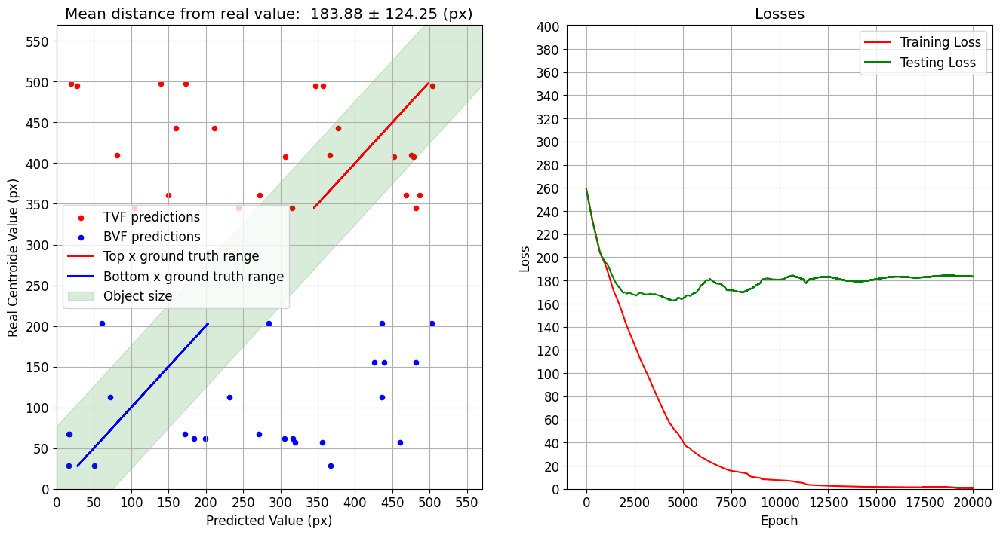

In [141]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize = (16,8))

y_losses = np.linspace(0, dl_epochs, dl_epochs)

plt.rcParams.update({'font.size': 12})

ax = axs[0]

y_preds = y_preds.reshape(len(y_preds),)

'''
Absolute error: |True value - Measured Value|
Relative error: |Absolute error / True value|
Percent  error: Relative error * 100
'''
rel_error = (np.abs(real_y - y_preds)/real_y)*100
distance = np.abs(real_y - y_preds)

TVF_real_y = [y for y in range(len(real_y)) if real_y[y] > IM_HEIGHT/2]
BVF_real_y = [y for y in range(len(real_y)) if real_y[y] < IM_HEIGHT/2]

# Scatter plots on the same axes
ax.scatter(y_preds[TVF_real_y], real_y[TVF_real_y], color='r', label='TVF predictions',alpha=1, s=20);
ax.scatter(y_preds[BVF_real_y], real_y[BVF_real_y], color='b', label='BVF predictions',alpha=1, s=20);

plus_minus_symbol = chr(0x00B1)
ax.set(xlabel='Predicted Value (px)', 
    xticks=np.arange(0, IM_HEIGHT + 3, step = 50),
    xlim=(0, IM_HEIGHT + 3),
    ylabel='Real Centroide Value (px)',
    yticks=np.arange(0, IM_HEIGHT + 3, step = 50),
    ylim=(0, IM_HEIGHT + 3),
    title=(f"Mean distance from real value: {np.mean(distance): .2f} {plus_minus_symbol}{np.std(distance): .2f} (px)"));
ax.grid(True)

ax.plot(real_y[TVF_real_y], real_y[TVF_real_y], 'r', alpha=1, label = 'Top x ground truth range') # Line plot
ax.plot(real_y[BVF_real_y], real_y[BVF_real_y], 'b', alpha=1, label = 'Bottom x ground truth range') 

diag_rect = patches.Rectangle(
    (min(real_y) - 50, (min(real_y))-(obj_region/2)/math.cos(math.radians(45)) - 50), 
                                max(real_y) + 400, obj_region, 
                                linewidth=1, edgecolor='g', facecolor='g', alpha=0.15, angle=45, label = 'Object size')
ax.add_patch(diag_rect) # Patch plot

ax.legend()

ax = axs[1]

ax.plot(y_losses, training_losses, 'r', label = 'Training Loss')
ax.plot(y_losses, testing_losses, 'g', label = 'Testing Loss')
ax.set(xlabel='Epoch',
        ylabel='Loss',
        yticks=np.arange(0, 401, step = 20),
        ylim=(0,401),
        title=(f"Losses"));
ax.legend(loc='upper right')
ax.grid(True)
    
plt.subplots_adjust(hspace=0.15)